In [208]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
import seaborn as sns


from sklearn.linear_model import LinearRegression, RidgeCV
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor, AdaBoostRegressor, StackingRegressor
from sklearn.multioutput import MultiOutputRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

np.random.seed(42)

plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

In [209]:
#DATASET-1
df_d1 = pd.read_csv(r'C:\Users\Yaveh\Downloads\Regresion_Base-Ensambles 1\D1_casi_lineal.csv')
print("=== DATASET D1 - INFORMACIÓN ===")
print(f"Dimensiones: {df_d1.shape}")
print(f"Columnas: {df_d1.columns.tolist()}")
print("\nPrimeras 5 filas:")
print(df_d1.head())
print("\nEstadísticas descriptivas:")
print(df_d1.describe())

print(f"\nValores nulos: {df_d1.isnull().sum().sum()}")

=== DATASET D1 - INFORMACIÓN ===
Dimensiones: (220, 2)
Columnas: ['x', 'y']

Primeras 5 filas:
          x          y
0  2.739560  12.891008
1 -0.611216   4.169111
2  3.585979  16.296053
3  1.973680  12.258439
4 -4.058227  -7.329185

Estadísticas descriptivas:
                x           y
count  220.000000  220.000000
mean    -0.083516    4.752657
std      2.842901    8.638212
min     -4.926377  -11.075360
25%     -2.699255   -2.956192
50%     -0.155191    4.828453
75%      2.452690   12.357405
max      4.923756   19.825621

Valores nulos: 0


In [154]:
X = df_d1[['x']]
y = df_d1['y']
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)
print(f"\n=== DIVISIÓN DE DATOS ===")
print(f"Entrenamiento: {X_train.shape[0]} muestras")
print(f"Prueba: {X_test.shape[0]} muestras")


=== DIVISIÓN DE DATOS ===
Entrenamiento: 154 muestras
Prueba: 66 muestras


In [155]:
models = {
    'LinearRegression': LinearRegression(),
    
    'MLPRegressor': MLPRegressor(
        hidden_layer_sizes=(64, 64), 
        activation='relu', 
        max_iter=2000, 
        early_stopping=True, 
        random_state=42
    ),
    
    'SVR': SVR(kernel='rbf', C=10, gamma='scale'),
    
    'DecisionTree': DecisionTreeRegressor(max_depth=5, random_state=42),
    
    'KNN': KNeighborsRegressor(n_neighbors=5),
    
    'Bagging': BaggingRegressor(
        estimator=KNeighborsRegressor(n_neighbors=5), 
        n_estimators=100, 
        random_state=42
    ),
    
    'AdaBoost': AdaBoostRegressor(
        n_estimators=200, 
        learning_rate=0.1, 
        random_state=42
    ),
    
    'Stacking': StackingRegressor(
        estimators=[
            ('lr', LinearRegression()),
            ('mlp', MLPRegressor(hidden_layer_sizes=(64,64), max_iter=2000, random_state=42)),
            ('svr', SVR(kernel='rbf', C=10)),
            ('dt', DecisionTreeRegressor(max_depth=5, random_state=42)),
            ('knn', KNeighborsRegressor(n_neighbors=5))
        ],
        final_estimator=RidgeCV()
    )
}

In [156]:
results_d1 = {}

print("\n=== ENTRENAMIENTO DE MODELOS ===")
for name, model in models.items():
    print(f"Entrenando: {name}")
    
    # Entrenar modelo
    model.fit(X_train, y_train)
    
    # Predecir
    y_pred = model.predict(X_test)
    
    # Calcular métricas
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Guardar resultados
    results_d1[name] = {
        'MAE': round(mae, 4),
        'MSE': round(mse, 4),
        'R2': round(r2, 4)
    }
    
    print(f"  - {name}: R² = {r2:.4f}")


=== ENTRENAMIENTO DE MODELOS ===
Entrenando: LinearRegression
  - LinearRegression: R² = 0.9839
Entrenando: MLPRegressor
  - MLPRegressor: R² = 0.9762
Entrenando: SVR
  - SVR: R² = 0.9822
Entrenando: DecisionTree
  - DecisionTree: R² = 0.9786
Entrenando: KNN
  - KNN: R² = 0.9831
Entrenando: Bagging
  - Bagging: R² = 0.9827
Entrenando: AdaBoost
  - AdaBoost: R² = 0.9790
Entrenando: Stacking
  - Stacking: R² = 0.9836


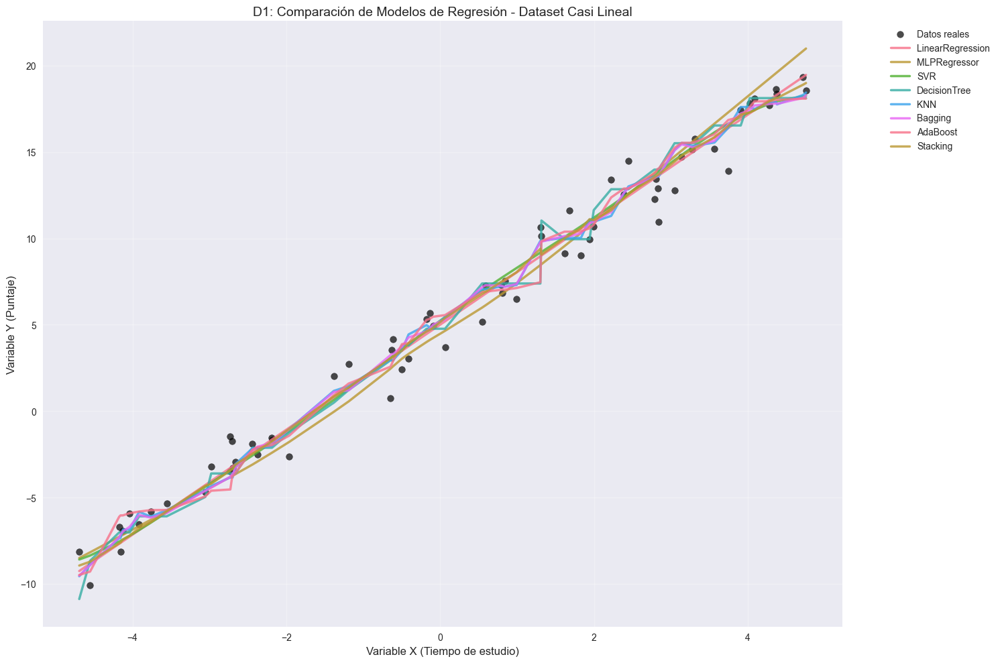

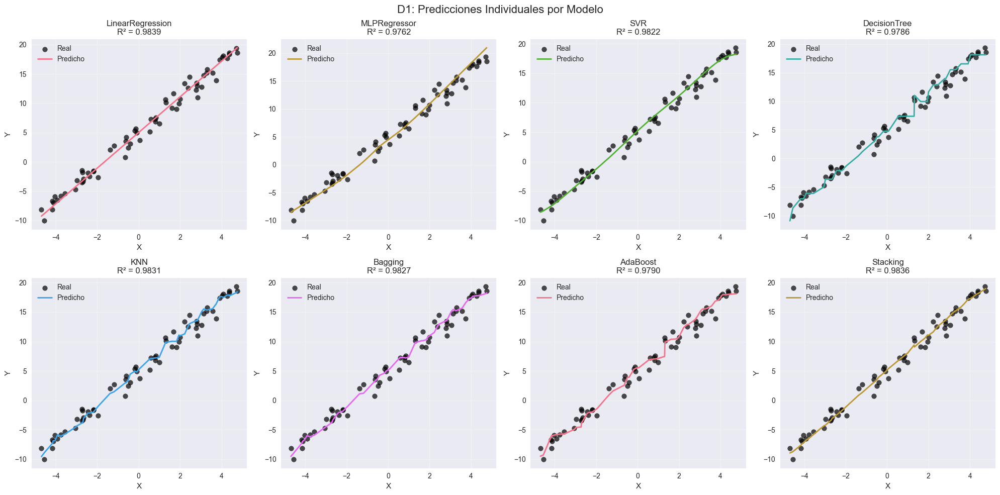

In [157]:
plt.figure(figsize=(15, 10))

x_sorted = np.sort(X_test.values.ravel())
sorted_idx = np.argsort(X_test.values.ravel())

plt.scatter(X_test, y_test, color='black', alpha=0.7, label='Datos reales', s=50)

for name, model in models.items():
    y_pred = model.predict(X_test)
    plt.plot(x_sorted, y_pred[sorted_idx], 
             linewidth=2.5, 
             label=name,
             alpha=0.8)

plt.xlabel('Variable X (Tiempo de estudio)', fontsize=12)
plt.ylabel('Variable Y (Puntaje)', fontsize=12)
plt.title('D1: Comparación de Modelos de Regresión - Dataset Casi Lineal', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.ravel()

for idx, (name, model) in enumerate(models.items()):
    y_pred = model.predict(X_test)
    
    axes[idx].scatter(X_test, y_test, color='black', alpha=0.7, label='Real')
    axes[idx].plot(x_sorted, y_pred[sorted_idx], 
                   linewidth=2, 
                   label='Predicho',
                   color=f'C{idx}')
    
    axes[idx].set_title(f'{name}\nR² = {results_d1[name]["R2"]:.4f}')
    axes[idx].set_xlabel('X')
    axes[idx].set_ylabel('Y')
    axes[idx].legend()
    axes[idx].grid(True, alpha=0.3)

for idx in range(len(models), len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('D1: Predicciones Individuales por Modelo', fontsize=16)
plt.tight_layout()
plt.show()


In [158]:
results_df = pd.DataFrame(results_d1).T
results_df = results_df.sort_values('R2', ascending=False)

print("\n" + "="*60)
print("RESULTADOS FINALES - DATASET D1")
print("="*60)
print(results_df)


RESULTADOS FINALES - DATASET D1
                     MAE     MSE      R2
LinearRegression  0.8555  1.1377  0.9839
Stacking          0.8518  1.1543  0.9836
KNN               0.8526  1.1922  0.9831
Bagging           0.8586  1.2218  0.9827
SVR               0.8985  1.2587  0.9822
AdaBoost          0.9390  1.4852  0.9790
DecisionTree      0.9479  1.5108  0.9786
MLPRegressor      1.0637  1.6786  0.9762


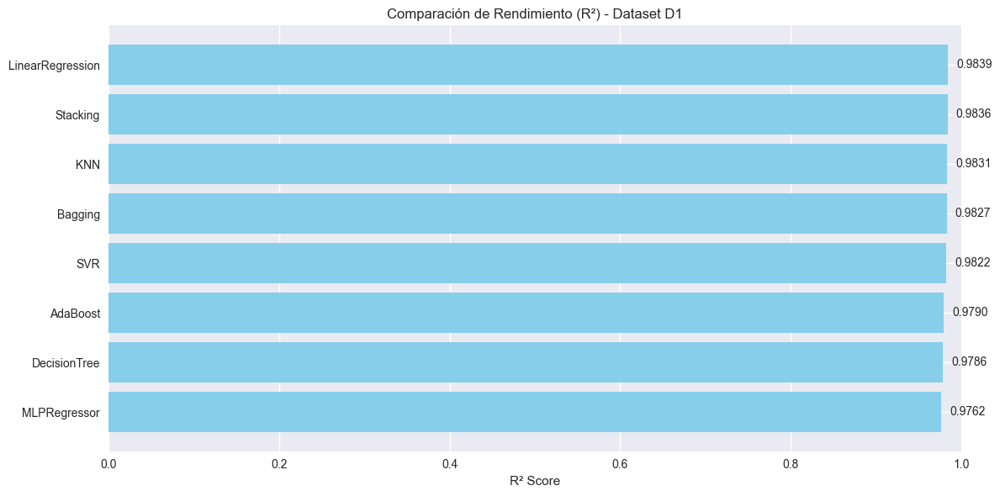

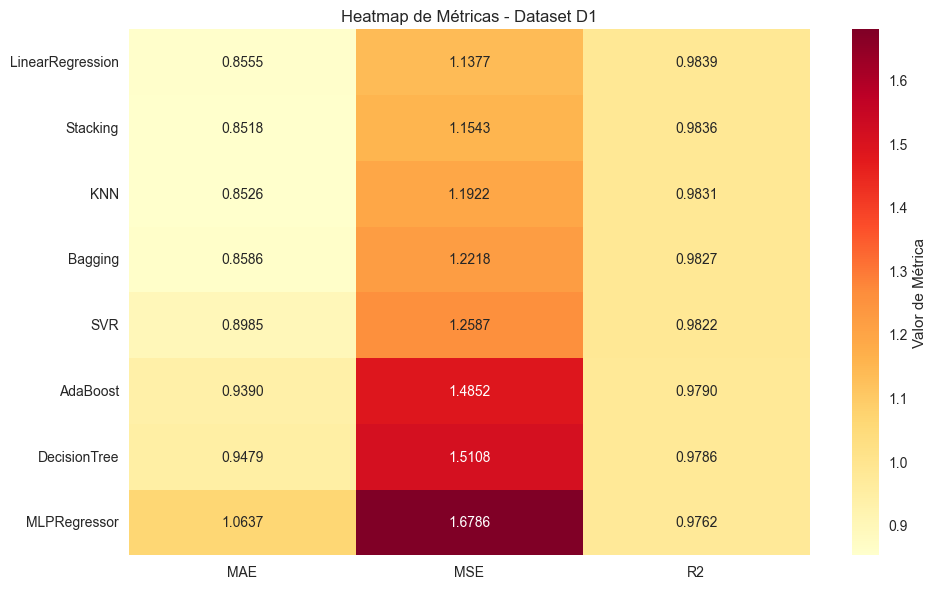

In [159]:
plt.figure(figsize=(12, 6))
results_df_sorted = results_df.sort_values('R2', ascending=True)
plt.barh(results_df_sorted.index, results_df_sorted['R2'], color='skyblue')
plt.xlabel('R² Score')
plt.title('Comparación de Rendimiento (R²) - Dataset D1')
plt.xlim(0, 1)
for i, v in enumerate(results_df_sorted['R2']):
    plt.text(v + 0.01, i, f'{v:.4f}', va='center')
plt.tight_layout()
plt.show()

# 8.2 Heatmap de métricas
plt.figure(figsize=(10, 6))
metrics_heatmap = results_df[['MAE', 'MSE', 'R2']]
sns.heatmap(metrics_heatmap, annot=True, cmap='YlOrRd', fmt='.4f', 
            cbar_kws={'label': 'Valor de Métrica'})
plt.title('Heatmap de Métricas - Dataset D1')
plt.tight_layout()
plt.show()

In [160]:
print("\n" + "="*60)
print("RESUMEN EJECUTIVO - DATASET D1")
print("="*60)
print(f"Mejor modelo (R²): {results_df.index[0]} - R² = {results_df.iloc[0]['R2']:.4f}")
print(f"Peor modelo (R²): {results_df.index[-1]} - R² = {results_df.iloc[-1]['R2']:.4f}")
print(f"Diferencia en R²: {results_df.iloc[0]['R2'] - results_df.iloc[-1]['R2']:.4f}")


best_model = models[results_df.index[0]]
y_train_pred = best_model.predict(X_train)
r2_train = r2_score(y_train, y_train_pred)
print(f"\nAnálisis del mejor modelo ({results_df.index[0]}):")
print(f"  - R² entrenamiento: {r2_train:.4f}")
print(f"  - R² prueba: {results_df.iloc[0]['R2']:.4f}")
print(f"  - Diferencia: {r2_train - results_df.iloc[0]['R2']:.4f}")


RESUMEN EJECUTIVO - DATASET D1
Mejor modelo (R²): LinearRegression - R² = 0.9839
Peor modelo (R²): MLPRegressor - R² = 0.9762
Diferencia en R²: 0.0077

Análisis del mejor modelo (LinearRegression):
  - R² entrenamiento: 0.9866
  - R² prueba: 0.9839
  - Diferencia: 0.0027


Para El DATASET 2

In [161]:
# DATASET-2
df_d1 = pd.read_csv(r'C:\Users\Yaveh\Downloads\Regresion_Base-Ensambles 1\D2_no_lineal.csv')
X = df_d1[['x']] 
y = df_d1['y']    


In [162]:
print("DATASET INFORMACIÓN")
print(f"Dimensiones: {df_d1.shape}")
print(f"Columnas: {df_d1.columns.tolist()}")
print("\nPrimeras 5 filas:")
print(df_d1.head())
print("\nEstadísticas descriptivas:")
print(df_d1.describe())
print(f"\nValores nulos: {df_d1.isnull().sum().sum()}")

DATASET INFORMACIÓN
Dimensiones: (220, 2)
Columnas: ['x', 'y']

Primeras 5 filas:
          x         y
0 -2.614977  2.281052
1 -3.266232  4.593117
2 -2.531734  2.714283
3  3.840217  6.535238
4 -0.331515  0.653388

Estadísticas descriptivas:
                x           y
count  220.000000  220.000000
mean     0.088714    2.607016
std      2.286509    2.616231
min     -3.963999   -1.661361
25%     -1.671188    0.257007
50%      0.084368    2.179107
75%      2.054846    4.426201
max      3.989947    8.742046

Valores nulos: 0


In [163]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42 )

print(f"Entrenamiento: {X_train.shape[0]} muestras")
print(f"Prueba: {X_test.shape[0]} muestras")

Entrenamiento: 154 muestras
Prueba: 66 muestras


In [164]:
models = {
    'LinearRegression': LinearRegression(),
    
    'MLPRegressor': MLPRegressor(
        hidden_layer_sizes=(64, 64), 
        activation='relu', 
        max_iter=2000, 
        early_stopping=True, 
        random_state=42
    ),
     'SVR': SVR(kernel='rbf', C=10, gamma='scale'),
    
    'DecisionTree': DecisionTreeRegressor(max_depth=5, random_state=42),
    
    'KNN': KNeighborsRegressor(n_neighbors=5),
    
    'Bagging': BaggingRegressor(
        estimator=KNeighborsRegressor(n_neighbors=5), 
        n_estimators=100, 
        random_state=42
    ),
    
    'AdaBoost': AdaBoostRegressor(
        n_estimators=200, 
        learning_rate=0.1, 
        random_state=42
    ),
    
    'Stacking': StackingRegressor(
        estimators=[
            ('lr', LinearRegression()),
            ('mlp', MLPRegressor(hidden_layer_sizes=(64,64), max_iter=2000, random_state=42)),
            ('svr', SVR(kernel='rbf', C=10)),
            ('dt', DecisionTreeRegressor(max_depth=5, random_state=42)),
            ('knn', KNeighborsRegressor(n_neighbors=5))
        ],
        final_estimator=RidgeCV()
    )
}

In [165]:
results_d1 = {}
print("\n=== ENTRENAMIENTO DE MODELOS ===")
for name, model in models.items():
    print(f"Entrenando: {name}")
    
    # Entrenar modelo
    model.fit(X_train, y_train)
    
    # Predecir
    y_pred = model.predict(X_test)
    
    # Calcular métricas
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Guardar resultados
    results_d1[name] = {
        'MAE': round(mae, 4),
        'MSE': round(mse, 4),
        'R2': round(r2, 4)
    }
    
    print(f"  - {name}: R² = {r2:.4f}")


=== ENTRENAMIENTO DE MODELOS ===
Entrenando: LinearRegression
  - LinearRegression: R² = -0.0371
Entrenando: MLPRegressor
  - MLPRegressor: R² = 0.9499
Entrenando: SVR
  - SVR: R² = 0.9603
Entrenando: DecisionTree
  - DecisionTree: R² = 0.9383
Entrenando: KNN
  - KNN: R² = 0.9623
Entrenando: Bagging
  - Bagging: R² = 0.9614
Entrenando: AdaBoost
  - AdaBoost: R² = 0.9404
Entrenando: Stacking
  - Stacking: R² = 0.9622


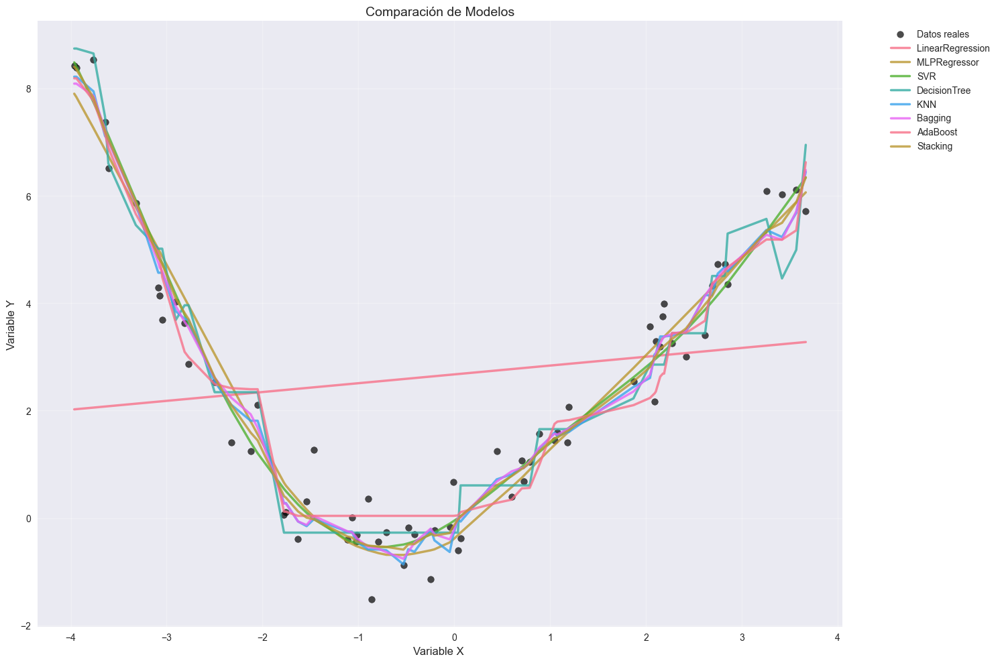

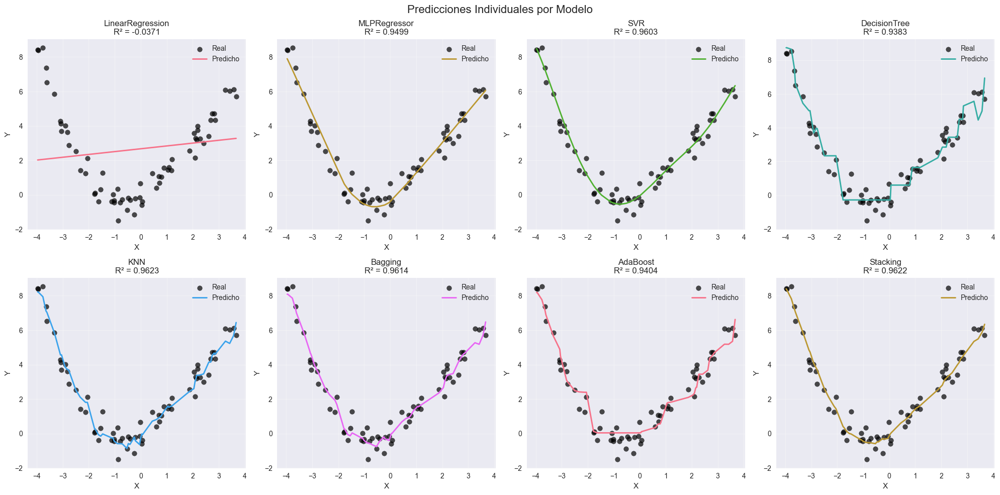

In [166]:
plt.figure(figsize=(15, 10))

x_sorted = np.sort(X_test.values.ravel())
sorted_idx = np.argsort(X_test.values.ravel())

# Puntos reales
plt.scatter(X_test, y_test, color='black', alpha=0.7, label='Datos reales', s=50)

for name, model in models.items():
    y_pred = model.predict(X_test)
    plt.plot(x_sorted, y_pred[sorted_idx], 
             linewidth=2.5, 
             label=name,
             alpha=0.8)

plt.xlabel('Variable X ', fontsize=12)
plt.ylabel('Variable Y', fontsize=12)
plt.title('Comparación de Modelos', fontsize=14)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 6.2 Gráficas individuales por modelo
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.ravel()

for idx, (name, model) in enumerate(models.items()):
    y_pred = model.predict(X_test)
    
    axes[idx].scatter(X_test, y_test, color='black', alpha=0.7, label='Real')
    axes[idx].plot(x_sorted, y_pred[sorted_idx], 
                   linewidth=2, 
                   label='Predicho',
                   color=f'C{idx}')
    
    axes[idx].set_title(f'{name}\nR² = {results_d1[name]["R2"]:.4f}')
    axes[idx].set_xlabel('X')
    axes[idx].set_ylabel('Y')
    axes[idx].legend()
    axes[idx].grid(True, alpha=0.3)

# Ocultar ejes sobrantes
for idx in range(len(models), len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('Predicciones Individuales por Modelo', fontsize=16)
plt.tight_layout()
plt.show()

In [167]:
results_df = pd.DataFrame(results_d1).T
results_df = results_df.sort_values('R2', ascending=False)

print("\n" + "="*60)
print("RESULTADOS FINALES - DATASET")
print("="*60)
print(results_df)


RESULTADOS FINALES - DATASET
                     MAE     MSE      R2
KNN               0.3958  0.2463  0.9623
Stacking          0.3936  0.2470  0.9622
Bagging           0.4004  0.2521  0.9614
SVR               0.4008  0.2592  0.9603
MLPRegressor      0.4715  0.3271  0.9499
AdaBoost          0.5050  0.3896  0.9404
DecisionTree      0.4878  0.4034  0.9383
LinearRegression  2.1554  6.7757 -0.0371


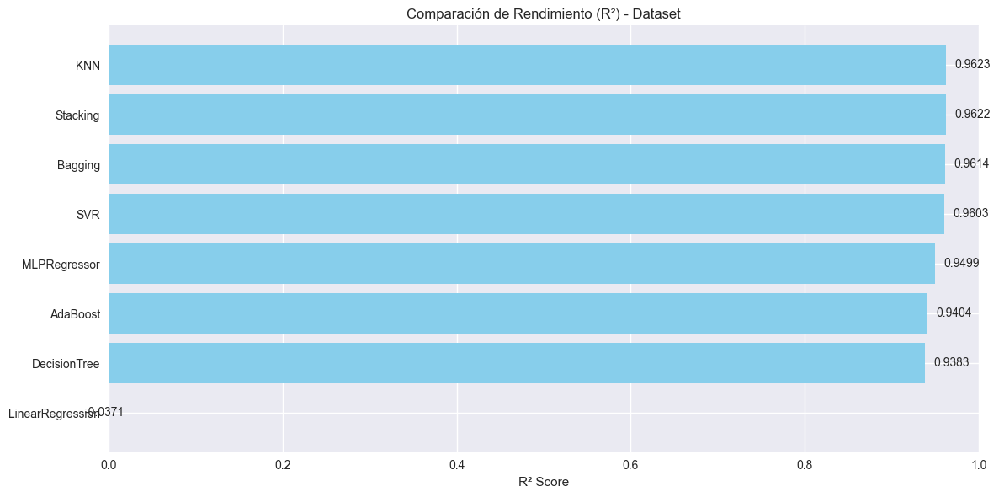

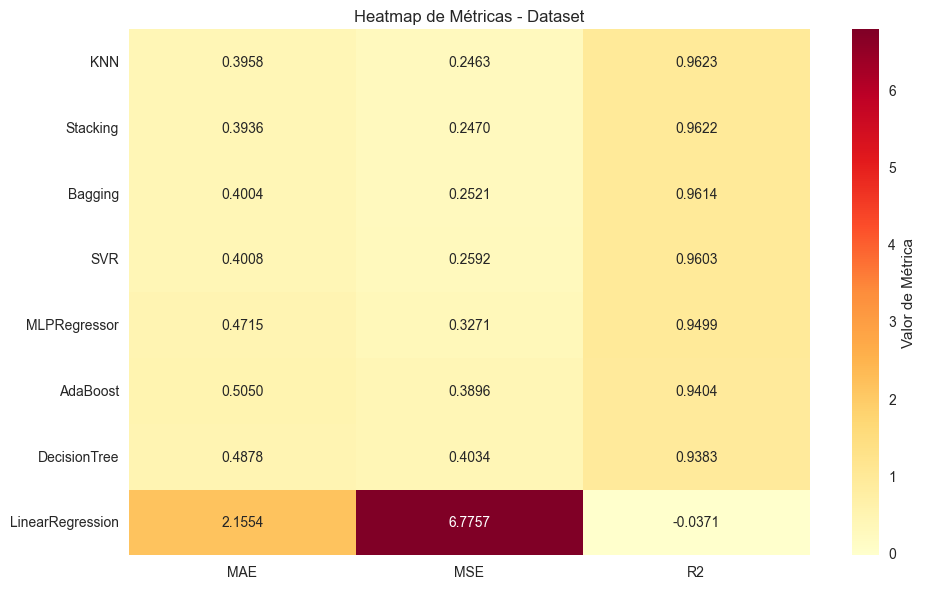

In [168]:
plt.figure(figsize=(12, 6))
results_df_sorted = results_df.sort_values('R2', ascending=True)
plt.barh(results_df_sorted.index, results_df_sorted['R2'], color='skyblue')
plt.xlabel('R² Score')
plt.title('Comparación de Rendimiento (R²) - Dataset')
plt.xlim(0, 1)
for i, v in enumerate(results_df_sorted['R2']):
    plt.text(v + 0.01, i, f'{v:.4f}', va='center')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
metrics_heatmap = results_df[['MAE', 'MSE', 'R2']]
sns.heatmap(metrics_heatmap, annot=True, cmap='YlOrRd', fmt='.4f', 
            cbar_kws={'label': 'Valor de Métrica'})
plt.title('Heatmap de Métricas - Dataset')
plt.tight_layout()
plt.show()

In [169]:
print("\n" + "="*60)
print("RESUMEN-DATASET")
print("="*60)
print(f"Mejor modelo (R²): {results_df.index[0]} - R² = {results_df.iloc[0]['R2']:.4f}")
print(f"Peor modelo (R²): {results_df.index[-1]} - R² = {results_df.iloc[-1]['R2']:.4f}")
print(f"Diferencia en R²: {results_df.iloc[0]['R2'] - results_df.iloc[-1]['R2']:.4f}")

best_model = models[results_df.index[0]]
y_train_pred = best_model.predict(X_train)
r2_train = r2_score(y_train, y_train_pred)
print(f"\nAnálisis del mejor modelo ({results_df.index[0]}):")
print(f"  - R² entrenamiento: {r2_train:.4f}")
print(f"  - R² prueba: {results_df.iloc[0]['R2']:.4f}")
print(f"  - Diferencia: {r2_train - results_df.iloc[0]['R2']:.4f}")


RESUMEN-DATASET
Mejor modelo (R²): KNN - R² = 0.9623
Peor modelo (R²): LinearRegression - R² = -0.0371
Diferencia en R²: 0.9994

Análisis del mejor modelo (KNN):
  - R² entrenamiento: 0.9669
  - R² prueba: 0.9623
  - Diferencia: 0.0046


DATASET 3 

In [170]:
df_d3 = pd.read_csv(r'C:\Users\Yaveh\Downloads\Regresion_Base-Ensambles 1\D3_no_lineal_misma_base_para_polynomial.csv')


In [171]:

X_original = df_d3[['x']]  
y = df_d3['y']  

# Aplicar PolynomialFeatures
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X_original)

# División entrenamiento/prueba CON DATOS POLINÓMICOS
X_train, X_test, y_train, y_test = train_test_split(
    X_poly, y, test_size=0.3, random_state=42  
)

print(f"Dimensiones originales de X: {X_original.shape}")
print(f"Dimensiones después de PolynomialFeatures: {X_poly.shape}")

Dimensiones originales de X: (220, 1)
Dimensiones después de PolynomialFeatures: (220, 2)


In [172]:
models = {
    'LinearRegression': LinearRegression(),
    'MLPRegressor': MLPRegressor(
        hidden_layer_sizes=(64, 64), 
        activation='relu', 
        max_iter=2000, 
        early_stopping=True, 
        random_state=42
    ),
    'SVR': SVR(kernel='rbf', C=10, gamma='scale'),
    'DecisionTree': DecisionTreeRegressor(max_depth=5, random_state=42),
    'KNN': KNeighborsRegressor(n_neighbors=5),
    'Bagging': BaggingRegressor(
        estimator=KNeighborsRegressor(n_neighbors=5), 
        n_estimators=100, 
        random_state=42
    ),
    'AdaBoost': AdaBoostRegressor(
        n_estimators=200, 
        learning_rate=0.1, 
        random_state=42
    ),
    'Stacking': StackingRegressor(
        estimators=[
            ('lr', LinearRegression()),
            ('mlp', MLPRegressor(hidden_layer_sizes=(64,64), max_iter=2000, random_state=42)),
            ('svr', SVR(kernel='rbf', C=10)),
            ('dt', DecisionTreeRegressor(max_depth=5, random_state=42)),
            ('knn', KNeighborsRegressor(n_neighbors=5))
        ],
        final_estimator=RidgeCV()
    )
}

In [173]:
results_d3 = {}

print("\n=== ENTRENAMIENTO DE MODELOS D3 ===")
for name, model in models.items():
    print(f"Entrenando: {name}")
    
    # Entrenar modelo CON DATOS POLINÓMICOS
    model.fit(X_train, y_train)
    
    # Predecir
    y_pred = model.predict(X_test)
    
    # Calcular métricas
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Guardar resultados
    results_d3[name] = {
        'MAE': round(mae, 4),
        'MSE': round(mse, 4),
        'R2': round(r2, 4)
    }
    
    print(f"  - {name}: R² = {r2:.4f}")


=== ENTRENAMIENTO DE MODELOS D3 ===
Entrenando: LinearRegression
  - LinearRegression: R² = 0.8941
Entrenando: MLPRegressor
  - MLPRegressor: R² = 0.9018
Entrenando: SVR
  - SVR: R² = 0.9609
Entrenando: DecisionTree
  - DecisionTree: R² = 0.9368
Entrenando: KNN
  - KNN: R² = 0.9613
Entrenando: Bagging
  - Bagging: R² = 0.9614
Entrenando: AdaBoost
  - AdaBoost: R² = 0.9399
Entrenando: Stacking
  - Stacking: R² = 0.9629


In [174]:
X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(
    X_original, y, test_size=0.3, random_state=42  
)

# Crear puntos para curva suave (usando datos originales)
x_range = np.linspace(X_original.min(), X_original.max(), 300).reshape(-1, 1)
x_range_poly = poly.transform(x_range)  # Transformar para predicción

# Ordenar datos de test para visualización
x_sorted_idx = np.argsort(X_test_orig.values.ravel())
x_sorted = X_test_orig.values[x_sorted_idx].ravel()

c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


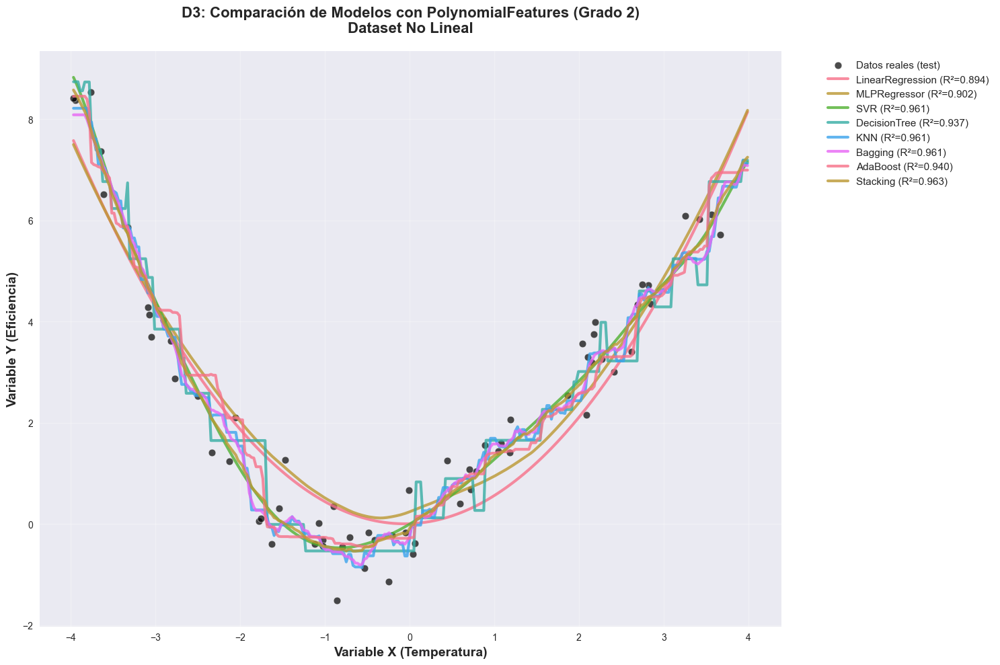

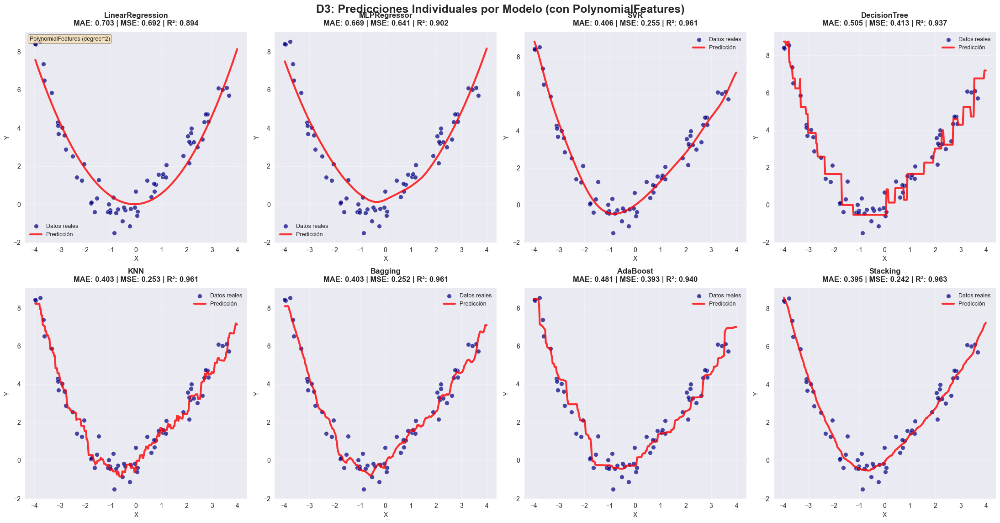

In [175]:
plt.figure(figsize=(15, 10))

# Puntos reales de test (datos originales)
plt.scatter(X_test_orig, y_test_orig, color='black', alpha=0.7, 
           label='Datos reales (test)', s=60, edgecolors='white', linewidth=0.5)

# Curvas de predicción de cada modelo
for name, model in models.items():
    # Predecir sobre el rango completo para curva suave
    y_pred_range = model.predict(x_range_poly)
    
    plt.plot(x_range, y_pred_range, 
             linewidth=3, 
             label=f'{name} (R²={results_d3[name]["R2"]:.3f})',
             alpha=0.8)

plt.xlabel('Variable X (Temperatura)', fontsize=14, fontweight='bold')
plt.ylabel('Variable Y (Eficiencia)', fontsize=14, fontweight='bold')
plt.title('D3: Comparación de Modelos con PolynomialFeatures (Grado 2)\nDataset No Lineal', 
          fontsize=16, fontweight='bold', pad=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(2, 4, figsize=(22, 12))
axes = axes.ravel()

model_names = list(models.keys())

for idx, model_name in enumerate(model_names):
    model = models[model_name]
    
    # Predecir sobre el rango completo para curva suave
    y_pred_range = model.predict(x_range_poly)
    
    # Puntos reales
    axes[idx].scatter(X_test_orig, y_test_orig, color='navy', alpha=0.7, 
                     label='Datos reales', s=50, edgecolors='white', linewidth=0.5)
    
    # Curva de predicción
    axes[idx].plot(x_range, y_pred_range, 
                   linewidth=3, 
                   label='Predicción',
                   color='red',
                   alpha=0.8)
    
    # Configuración del subplot
    axes[idx].set_title(f'{model_name}\nMAE: {results_d3[model_name]["MAE"]:.3f} | '
                       f'MSE: {results_d3[model_name]["MSE"]:.3f} | '
                       f'R²: {results_d3[model_name]["R2"]:.3f}', 
                       fontsize=12, fontweight='bold', pad=10)
    axes[idx].set_xlabel('X', fontsize=10)
    axes[idx].set_ylabel('Y', fontsize=10)
    axes[idx].legend(fontsize=9)
    axes[idx].grid(True, alpha=0.3)
    
    # Añadir texto informativo sobre PolynomialFeatures
    if idx == 0:
        axes[idx].text(0.02, 0.98, 'PolynomialFeatures (degree=2)', 
                      transform=axes[idx].transAxes, fontsize=9, 
                      verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# Ocultar ejes sobrantes
for idx in range(len(models), len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('D3: Predicciones Individuales por Modelo (con PolynomialFeatures)', 
             fontsize=18, fontweight='bold', y=0.95)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

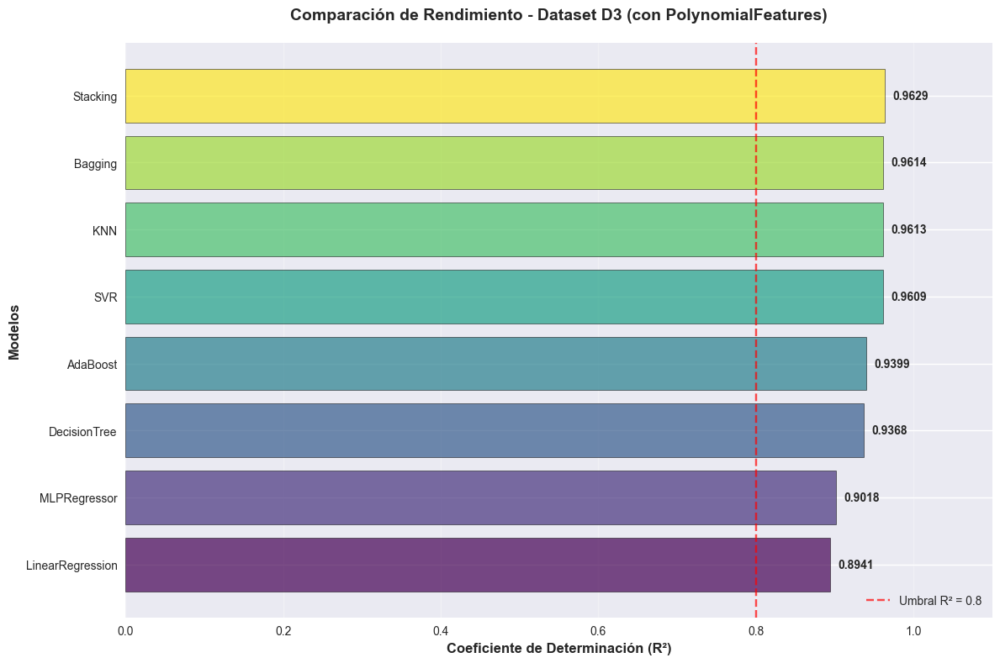

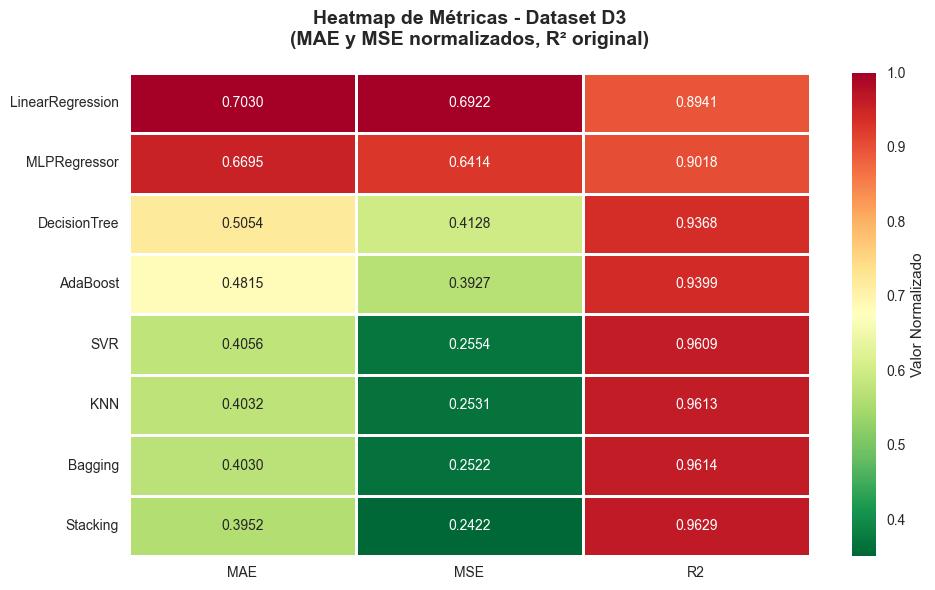

In [176]:
results_df_d3 = pd.DataFrame(results_d3).T
results_df_d3 = results_df_d3.sort_values('R2', ascending=True)

# Gráfica de barras horizontal para R²
plt.figure(figsize=(12, 8))
bars = plt.barh(results_df_d3.index, results_df_d3['R2'], 
                color=plt.cm.viridis(np.linspace(0, 1, len(results_df_d3))),
                alpha=0.7, edgecolor='black', linewidth=0.5)

# Añadir valores en las barras
for i, (bar, value) in enumerate(zip(bars, results_df_d3['R2'])):
    plt.text(value + 0.01, bar.get_y() + bar.get_height()/2, 
             f'{value:.4f}', ha='left', va='center', fontweight='bold')

plt.xlabel('Coeficiente de Determinación (R²)', fontsize=12, fontweight='bold')
plt.ylabel('Modelos', fontsize=12, fontweight='bold')
plt.title('Comparación de Rendimiento - Dataset D3 (con PolynomialFeatures)', 
          fontsize=14, fontweight='bold', pad=20)
plt.xlim(0, 1.1)
plt.grid(True, alpha=0.3, axis='x')
plt.axvline(x=0.8, color='red', linestyle='--', alpha=0.7, label='Umbral R² = 0.8')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
metrics_heatmap = results_df_d3[['MAE', 'MSE', 'R2']]

# Normalizar para mejor visualización (excepto R²)
metrics_normalized = metrics_heatmap.copy()
metrics_normalized[['MAE', 'MSE']] = metrics_heatmap[['MAE', 'MSE']] / metrics_heatmap[['MAE', 'MSE']].max()

sns.heatmap(metrics_normalized, annot=metrics_heatmap, cmap='RdYlGn_r', 
            fmt='.4f', cbar_kws={'label': 'Valor Normalizado'},
            linewidths=1, linecolor='white', annot_kws={'size': 10})

plt.title('Heatmap de Métricas - Dataset D3\n(MAE y MSE normalizados, R² original)', 
          fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

In [177]:
print("\n" + "="*70)
print("RESULTADOS FINALES - DATASET D3")
print("="*70)
print(results_df_d3.sort_values('R2', ascending=False))

print(f"\nMejor modelo: {results_df_d3['R2'].idxmax()} (R² = {results_df_d3['R2'].max():.4f})")
print(f"Peor modelo: {results_df_d3['R2'].idxmin()} (R² = {results_df_d3['R2'].min():.4f})")


RESULTADOS FINALES - DATASET D3
                     MAE     MSE      R2
Stacking          0.3952  0.2422  0.9629
Bagging           0.4030  0.2522  0.9614
KNN               0.4032  0.2531  0.9613
SVR               0.4056  0.2554  0.9609
AdaBoost          0.4815  0.3927  0.9399
DecisionTree      0.5054  0.4128  0.9368
MLPRegressor      0.6695  0.6414  0.9018
LinearRegression  0.7030  0.6922  0.8941

Mejor modelo: Stacking (R² = 0.9629)
Peor modelo: LinearRegression (R² = 0.8941)


Data set 4

In [178]:
df_d4 = pd.read_csv(r'C:\Users\Yaveh\Downloads\Regresion_Base-Ensambles 1\D4_2x1y_no_lineal.csv')

# Separar características y variable objetivo
X = df_d4[['x1', 'x2']]  # 2 variables independientes
y = df_d4['y']           # 1 variable dependiente

# División entrenamiento/prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42  
)

print("=== DATASET D4 - INFORMACIÓN ===")
print(f"Dimensiones: {df_d4.shape}")
print(f"Variables X: {X.columns.tolist()}")
print(f"Variable Y: y")
print(f"Entrenamiento: {X_train.shape[0]} muestras")
print(f"Prueba: {X_test.shape[0]} muestras")
print(f"\nEstadísticas descriptivas:")
print(df_d4.describe())

=== DATASET D4 - INFORMACIÓN ===
Dimensiones: (220, 3)
Variables X: ['x1', 'x2']
Variable Y: y
Entrenamiento: 154 muestras
Prueba: 66 muestras

Estadísticas descriptivas:
               x1          x2           y
count  220.000000  220.000000  220.000000
mean     0.078927   -0.059989    0.876937
std      1.738293    1.741006    1.146181
min     -2.986147   -2.996888   -1.792107
25%     -1.472136   -1.709889    0.066194
50%     -0.058703   -0.067651    0.901571
75%      1.600145    1.503433    1.681550
max      2.991657    2.996531    3.987879


In [179]:
models = {
    'LinearRegression': LinearRegression(),
    'MLPRegressor': MLPRegressor(
        hidden_layer_sizes=(64, 64), 
        activation='relu', 
        max_iter=2000, 
        early_stopping=True, 
        random_state=42
    ),
    'SVR': SVR(kernel='rbf', C=10, gamma='scale'),
    'DecisionTree': DecisionTreeRegressor(max_depth=5, random_state=42),
    'KNN': KNeighborsRegressor(n_neighbors=5),
    'Bagging': BaggingRegressor(
        estimator=KNeighborsRegressor(n_neighbors=5), 
        n_estimators=100, 
        random_state=42
    ),
    'AdaBoost': AdaBoostRegressor(
        n_estimators=200, 
        learning_rate=0.1, 
        random_state=42
    ),
    'Stacking': StackingRegressor(
        estimators=[
            ('lr', LinearRegression()),
            ('mlp', MLPRegressor(hidden_layer_sizes=(64,64), max_iter=2000, random_state=42)),
            ('svr', SVR(kernel='rbf', C=10)),
            ('dt', DecisionTreeRegressor(max_depth=5, random_state=42)),
            ('knn', KNeighborsRegressor(n_neighbors=5))
        ],
        final_estimator=RidgeCV()
    )
}

In [180]:
results_d4 = {}

print("\n=== ENTRENAMIENTO DE MODELOS D4 ===")
for name, model in models.items():
    print(f"Entrenando: {name}")
    
    # Entrenar modelo
    model.fit(X_train, y_train)
    
    # Predecir
    y_pred = model.predict(X_test)
    
    # Calcular métricas
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Guardar resultados
    results_d4[name] = {
        'MAE': round(mae, 4),
        'MSE': round(mse, 4),
        'R2': round(r2, 4)
    }
    
    print(f"  - {name}: R² = {r2:.4f}")



=== ENTRENAMIENTO DE MODELOS D4 ===
Entrenando: LinearRegression
  - LinearRegression: R² = 0.1114
Entrenando: MLPRegressor
  - MLPRegressor: R² = 0.6565
Entrenando: SVR
  - SVR: R² = 0.6908
Entrenando: DecisionTree
  - DecisionTree: R² = 0.5175
Entrenando: KNN
  - KNN: R² = 0.5810
Entrenando: Bagging
  - Bagging: R² = 0.5878
Entrenando: AdaBoost
  - AdaBoost: R² = 0.5746
Entrenando: Stacking
  - Stacking: R² = 0.6587


c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X

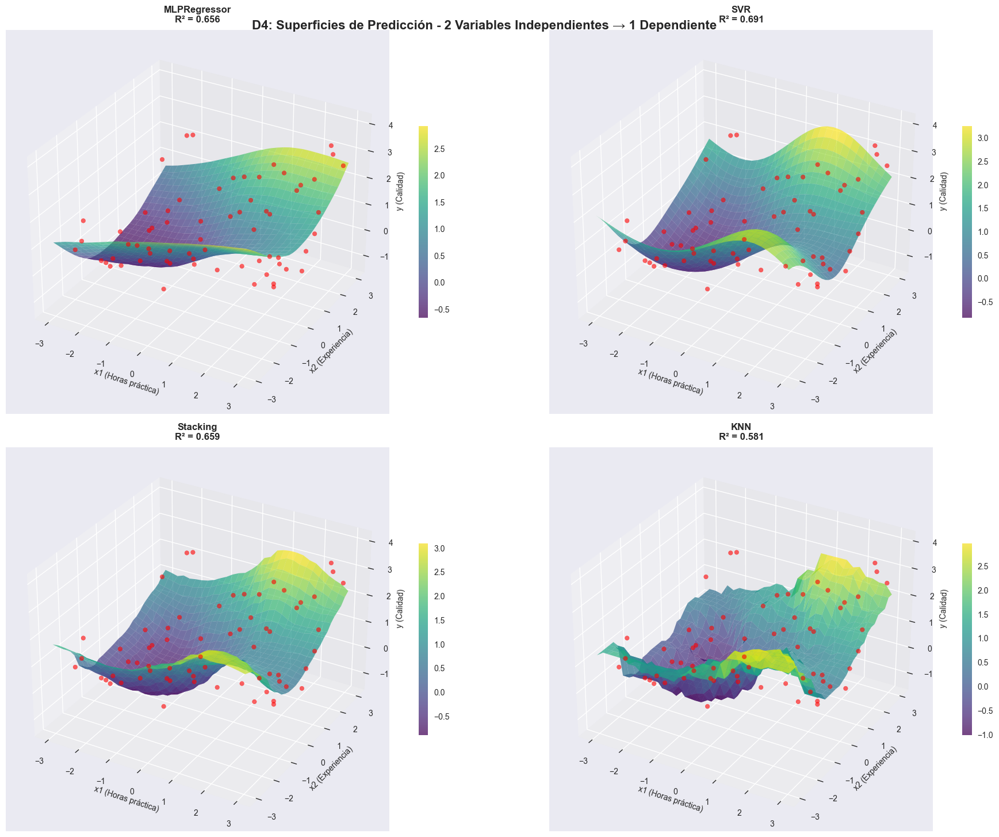

In [181]:
from mpl_toolkits.mplot3d import Axes3D

# Crear malla para superficie
x1_range = np.linspace(X['x1'].min(), X['x1'].max(), 30)
x2_range = np.linspace(X['x2'].min(), X['x2'].max(), 30)
X1_mesh, X2_mesh = np.meshgrid(x1_range, x2_range)

# Preparar datos para predicción
mesh_points = np.c_[X1_mesh.ravel(), X2_mesh.ravel()]

# Gráfica 3D comparativa - Mejores modelos
best_models = ['MLPRegressor', 'SVR', 'Stacking', 'KNN']  # Seleccionar los mejores para visualizar

fig = plt.figure(figsize=(20, 15))

for idx, model_name in enumerate(best_models, 1):
    ax = fig.add_subplot(2, 2, idx, projection='3d')
    model = models[model_name]
    
    # Predecir sobre la malla
    Z_pred = model.predict(mesh_points)
    Z_mesh = Z_pred.reshape(X1_mesh.shape)
    
    # Superficie de predicción
    surf = ax.plot_surface(X1_mesh, X2_mesh, Z_mesh, cmap='viridis', 
                          alpha=0.7, linewidth=0, antialiased=True)
    
    # Puntos reales
    ax.scatter(X_test['x1'], X_test['x2'], y_test, color='red', 
              alpha=0.6, s=30, label='Datos reales (test)')
    
    ax.set_xlabel('x1 (Horas práctica)', fontsize=10)
    ax.set_ylabel('x2 (Experiencia)', fontsize=10)
    ax.set_zlabel('y (Calidad)', fontsize=10)
    ax.set_title(f'{model_name}\nR² = {results_d4[model_name]["R2"]:.3f}', 
                fontsize=12, fontweight='bold', pad=10)
    
    # Añadir barra de color
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=20)

plt.suptitle('D4: Superficies de Predicción - 2 Variables Independientes → 1 Dependiente', 
             fontsize=16, fontweight='bold', y=0.95)
plt.tight_layout()
plt.show()


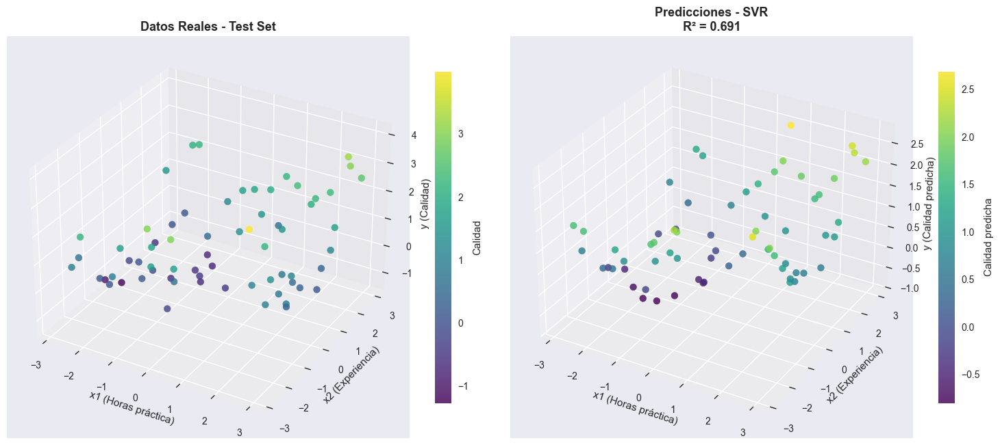

In [182]:
best_model_name = max(results_d4.items(), key=lambda x: x[1]['R2'])[0]
best_model = models[best_model_name]

fig = plt.figure(figsize=(15, 10))

# Subplot 1: Datos reales
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
scatter1 = ax1.scatter(X_test['x1'], X_test['x2'], y_test, 
                      c=y_test, cmap='viridis', s=50, alpha=0.8)
ax1.set_xlabel('x1 (Horas práctica)', fontsize=11)
ax1.set_ylabel('x2 (Experiencia)', fontsize=11)
ax1.set_zlabel('y (Calidad)', fontsize=11)
ax1.set_title('Datos Reales - Test Set', fontsize=13, fontweight='bold')
plt.colorbar(scatter1, ax=ax1, shrink=0.5, label='Calidad')

# Subplot 2: Predicciones del mejor modelo
ax2 = fig.add_subplot(1, 2, 2, projection='3d')
y_pred_best = best_model.predict(X_test)
scatter2 = ax2.scatter(X_test['x1'], X_test['x2'], y_pred_best, 
                      c=y_pred_best, cmap='viridis', s=50, alpha=0.8)
ax2.set_xlabel('x1 (Horas práctica)', fontsize=11)
ax2.set_ylabel('x2 (Experiencia)', fontsize=11)
ax2.set_zlabel('y (Calidad predicha)', fontsize=11)
ax2.set_title(f'Predicciones - {best_model_name}\nR² = {results_d4[best_model_name]["R2"]:.3f}', 
             fontsize=13, fontweight='bold')
plt.colorbar(scatter2, ax=ax2, shrink=0.5, label='Calidad predicha')

plt.tight_layout()
plt.show()

c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserW

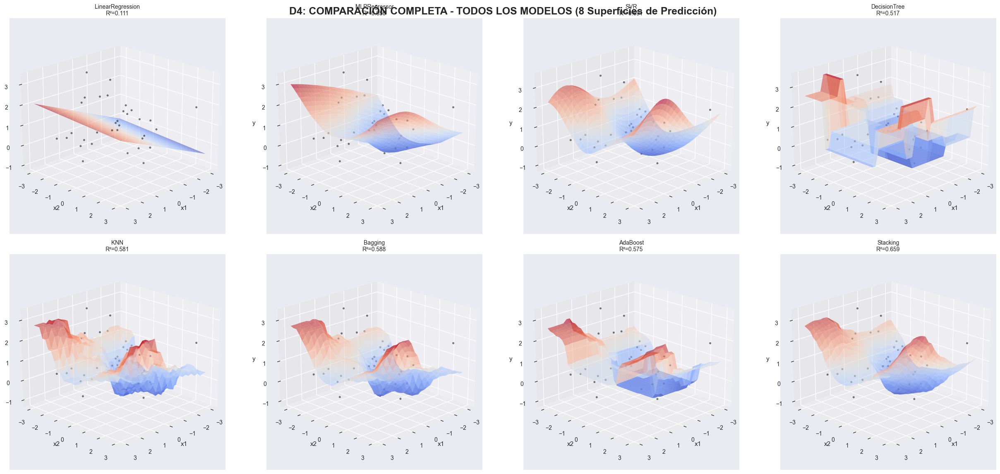

In [183]:
fig3 = plt.figure(figsize=(25, 12))

for idx, model_name in enumerate(model_names, 1):
    ax = fig3.add_subplot(2, 4, idx, projection='3d')
    model = models[model_name]
    
    # Predecir sobre la malla
    Z_pred = model.predict(mesh_points)
    Z_mesh = Z_pred.reshape(X1_mesh.shape)
    
    # Superficie de predicción (más simple para ahorrar espacio)
    surf = ax.plot_surface(X1_mesh, X2_mesh, Z_mesh, cmap='coolwarm', 
                          alpha=0.6, linewidth=0, antialiased=True, rstride=1, cstride=1)
    
    # Puntos reales (menos para no saturar)
    ax.scatter(X_test['x1'][::2], X_test['x2'][::2], y_test[::2], 
              color='black', alpha=0.5, s=10)
    
    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.set_zlabel('y')
    ax.set_title(f'{model_name}\nR²={results_d4[model_name]["R2"]:.3f}', 
                fontsize=10, pad=5)
    
    # Rotar para mejor ángulo
    ax.view_init(elev=20, azim=45)

plt.suptitle('D4: COMPARACIÓN COMPLETA - TODOS LOS MODELOS (8 Superficies de Predicción)', 
             fontsize=18, fontweight='bold', y=0.95)
plt.tight_layout()
plt.show()


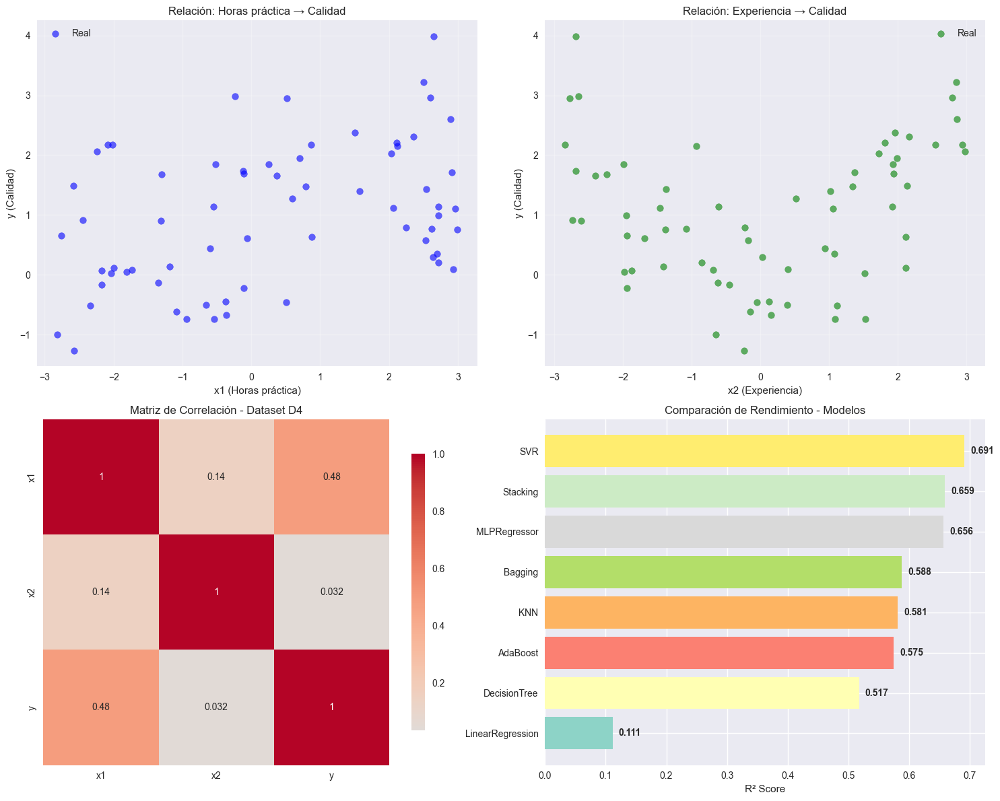

In [184]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Relación x1 vs y
axes[0, 0].scatter(X_test['x1'], y_test, alpha=0.6, color='blue', label='Real')
axes[0, 0].set_xlabel('x1 (Horas práctica)')
axes[0, 0].set_ylabel('y (Calidad)')
axes[0, 0].set_title('Relación: Horas práctica → Calidad')
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].legend()

# Relación x2 vs y
axes[0, 1].scatter(X_test['x2'], y_test, alpha=0.6, color='green', label='Real')
axes[0, 1].set_xlabel('x2 (Experiencia)')
axes[0, 1].set_ylabel('y (Calidad)')
axes[0, 1].set_title('Relación: Experiencia → Calidad')
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].legend()

# Heatmap de correlación
correlation_matrix = df_d4.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, 
            ax=axes[1, 0], square=True, cbar_kws={'shrink': 0.8})
axes[1, 0].set_title('Matriz de Correlación - Dataset D4')

# Comparación de rendimiento de modelos
results_df_d4 = pd.DataFrame(results_d4).T
results_df_d4_sorted = results_df_d4.sort_values('R2', ascending=True)
bars = axes[1, 1].barh(results_df_d4_sorted.index, results_df_d4_sorted['R2'], 
                      color=plt.cm.Set3(np.linspace(0, 1, len(results_df_d4_sorted))))
axes[1, 1].set_xlabel('R² Score')
axes[1, 1].set_title('Comparación de Rendimiento - Modelos')
for i, (bar, value) in enumerate(zip(bars, results_df_d4_sorted['R2'])):
    axes[1, 1].text(value + 0.01, bar.get_y() + bar.get_height()/2, 
                   f'{value:.3f}', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

In [185]:
print("\n" + "="*70)
print("RESULTADOS FINALES - DATASET D4")
print("="*70)
results_df_d4 = pd.DataFrame(results_d4).T.sort_values('R2', ascending=False)
print(results_df_d4)

print(f"\nMEJOR MODELO: {best_model_name}")
print(f"R² = {results_d4[best_model_name]['R2']:.4f}")
print(f"MAE = {results_d4[best_model_name]['MAE']:.4f}")
print(f"MSE = {results_d4[best_model_name]['MSE']:.4f}")

# Análisis comparativo
print(f"\nCOMPARATIVA:")
print(f"- Mejor R²: {results_df_d4['R2'].max():.4f} ({results_df_d4['R2'].idxmax()})")
print(f"- Peor R²: {results_df_d4['R2'].min():.4f} ({results_df_d4['R2'].idxmin()})")
print(f"- Diferencia: {results_df_d4['R2'].max() - results_df_d4['R2'].min():.4f}")



RESULTADOS FINALES - DATASET D4
                     MAE     MSE      R2
SVR               0.5466  0.4147  0.6908
Stacking          0.5821  0.4577  0.6587
MLPRegressor      0.5656  0.4606  0.6565
Bagging           0.6183  0.5528  0.5878
KNN               0.6244  0.5618  0.5810
AdaBoost          0.6217  0.5705  0.5746
DecisionTree      0.6250  0.6470  0.5175
LinearRegression  0.9292  1.1916  0.1114

MEJOR MODELO: SVR
R² = 0.6908
MAE = 0.5466
MSE = 0.4147

COMPARATIVA:
- Mejor R²: 0.6908 (SVR)
- Peor R²: 0.1114 (LinearRegression)
- Diferencia: 0.5794


In [186]:
df_d5 = pd.read_csv(r'C:\Users\Yaveh\Downloads\Regresion_Base-Ensambles 1\D5_1x2y_no_lineal.csv')

# Separar características y variable objetivo
X = df_d5[['x']]           # 1 variable independiente
y = df_d5[['y1', 'y2']] 

In [187]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42  
)

print("=== DATASET D5 - INFORMACIÓN ===")
print(f"Dimensiones: {df_d5.shape}")
print(f"Variable X: {X.columns.tolist()}")
print(f"Variables Y: {y.columns.tolist()}")
print(f"Entrenamiento: {X_train.shape[0]} muestras")
print(f"Prueba: {X_test.shape[0]} muestras")
print(f"\nEstadísticas descriptivas:")
print(df_d5.describe())

=== DATASET D5 - INFORMACIÓN ===
Dimensiones: (220, 3)
Variable X: ['x']
Variables Y: ['y1', 'y2']
Entrenamiento: 154 muestras
Prueba: 66 muestras

Estadísticas descriptivas:
                x          y1          y2
count  220.000000  220.000000  220.000000
mean     3.319186   -0.041522    0.060488
std      1.851398    0.724578    0.679923
min      0.027054   -1.223626   -1.251838
25%      1.614097   -0.714555   -0.577606
50%      3.283642   -0.039913    0.129445
75%      4.997893    0.613210    0.712703
max      6.275832    1.228754    1.111362


In [188]:
from sklearn.multioutput import MultiOutputRegressor

# Modelos que soportan multi-output nativamente
models_multi = {
    'LinearRegression': LinearRegression(),
    'DecisionTree': DecisionTreeRegressor(max_depth=5, random_state=42),
    'KNN': KNeighborsRegressor(n_neighbors=5),
}

# Modelos que necesitan wrapper MultiOutputRegressor
models_wrapped = {
    'MLPRegressor': MultiOutputRegressor(
        MLPRegressor(hidden_layer_sizes=(64, 64), activation='relu', 
                    max_iter=2000, early_stopping=True, random_state=42)
    ),
    'SVR': MultiOutputRegressor(SVR(kernel='rbf', C=10, gamma='scale')),
    'Bagging': MultiOutputRegressor(
        BaggingRegressor(estimator=KNeighborsRegressor(n_neighbors=5), 
                        n_estimators=100, random_state=42)
    ),
    'AdaBoost': MultiOutputRegressor(
        AdaBoostRegressor(n_estimators=200, learning_rate=0.1, random_state=42)
    ),
}

# Combinar todos los modelos (SIN STACKING)
models_d5 = {**models_multi, **models_wrapped}

print(f"\nModelos configurados para multi-output (sin Stacking): {list(models_d5.keys())}")


Modelos configurados para multi-output (sin Stacking): ['LinearRegression', 'DecisionTree', 'KNN', 'MLPRegressor', 'SVR', 'Bagging', 'AdaBoost']


In [189]:
results_d5_y1 = {}
results_d5_y2 = {}

print("\n=== ENTRENAMIENTO DE MODELOS D5 ===")
for name, model in models_d5.items():
    print(f"Entrenando: {name}")
    
    # Entrenar modelo
    model.fit(X_train, y_train)
    
    # Predecir
    y_pred = model.predict(X_test)
    
    # Calcular métricas para y1
    mae_y1 = mean_absolute_error(y_test['y1'], y_pred[:, 0])
    mse_y1 = mean_squared_error(y_test['y1'], y_pred[:, 0])
    r2_y1 = r2_score(y_test['y1'], y_pred[:, 0])
    
    # Calcular métricas para y2
    mae_y2 = mean_absolute_error(y_test['y2'], y_pred[:, 1])
    mse_y2 = mean_squared_error(y_test['y2'], y_pred[:, 1])
    r2_y2 = r2_score(y_test['y2'], y_pred[:, 1])
    
    # Guardar resultados por variable
    results_d5_y1[name] = {
        'MAE': round(mae_y1, 4),
        'MSE': round(mse_y1, 4),
        'R2': round(r2_y1, 4)
    }
    
    results_d5_y2[name] = {
        'MAE': round(mae_y2, 4),
        'MSE': round(mse_y2, 4),
        'R2': round(r2_y2, 4)
    }
    
    print(f"  - {name}:")
    print(f"    y1 - R² = {r2_y1:.4f}, MAE = {mae_y1:.4f}")
    print(f"    y2 - R² = {r2_y2:.4f}, MAE = {mae_y2:.4f}")



=== ENTRENAMIENTO DE MODELOS D5 ===
Entrenando: LinearRegression
  - LinearRegression:
    y1 - R² = 0.6099, MAE = 0.4134
    y2 - R² = 0.0233, MAE = 0.5614
Entrenando: DecisionTree
  - DecisionTree:
    y1 - R² = 0.9345, MAE = 0.1570
    y2 - R² = 0.9590, MAE = 0.1057
Entrenando: KNN
  - KNN:
    y1 - R² = 0.9396, MAE = 0.1511
    y2 - R² = 0.9643, MAE = 0.0978
Entrenando: MLPRegressor
  - MLPRegressor:
    y1 - R² = 0.8943, MAE = 0.1905
    y2 - R² = 0.9659, MAE = 0.0914
Entrenando: SVR
  - SVR:
    y1 - R² = 0.9516, MAE = 0.1386
    y2 - R² = 0.9737, MAE = 0.0832
Entrenando: Bagging
  - Bagging:
    y1 - R² = 0.9435, MAE = 0.1480
    y2 - R² = 0.9677, MAE = 0.0923
Entrenando: AdaBoost
  - AdaBoost:
    y1 - R² = 0.9358, MAE = 0.1680
    y2 - R² = 0.9375, MAE = 0.1344


In [190]:
x_range = np.linspace(X['x'].min(), X['x'].max(), 300).reshape(-1, 1)

# Ordenar datos de test para visualización
x_sorted_idx = np.argsort(X_test.values.ravel())
x_sorted = X_test.values[x_sorted_idx].ravel()


c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validatio

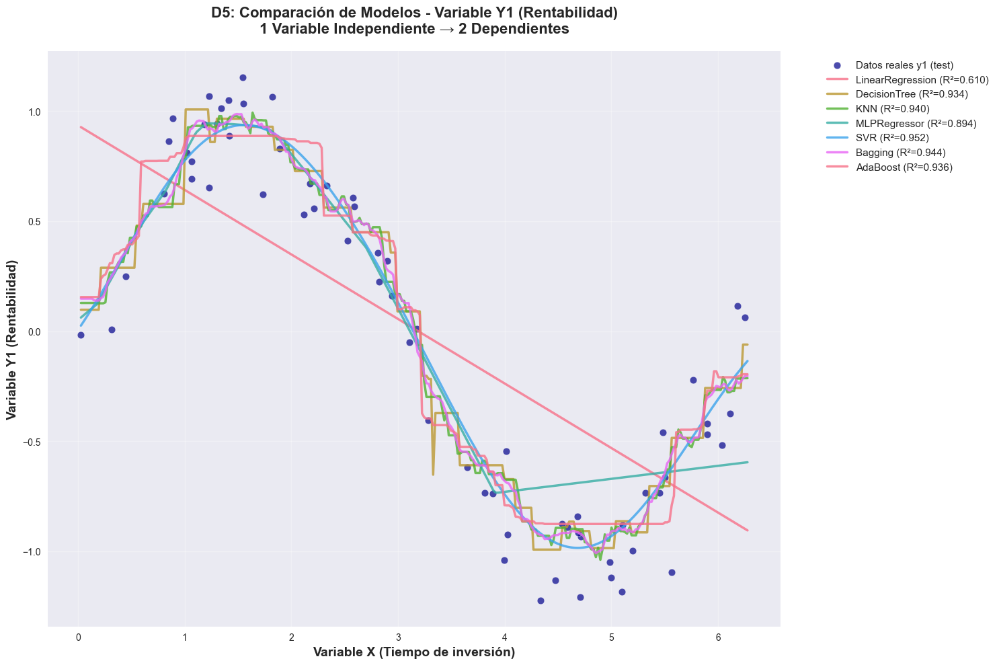

In [191]:
plt.figure(figsize=(15, 10))

# Puntos reales de test para y1
plt.scatter(X_test, y_test['y1'], color='darkblue', alpha=0.7, 
           label='Datos reales y1 (test)', s=60, edgecolors='white', linewidth=0.5)

# Curvas de predicción de cada modelo para y1
for name, model in models_d5.items():
    # Predecir sobre el rango completo para curva suave
    y_pred_range = model.predict(x_range)
    y1_pred_range = y_pred_range[:, 0]  # Primera variable: y1
    
    plt.plot(x_range, y1_pred_range, 
             linewidth=2.5, 
             label=f'{name} (R²={results_d5_y1[name]["R2"]:.3f})',
             alpha=0.8)

plt.xlabel('Variable X (Tiempo de inversión)', fontsize=14, fontweight='bold')
plt.ylabel('Variable Y1 (Rentabilidad)', fontsize=14, fontweight='bold')
plt.title('D5: Comparación de Modelos - Variable Y1 (Rentabilidad)\n1 Variable Independiente → 2 Dependientes', 
          fontsize=16, fontweight='bold', pad=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validatio

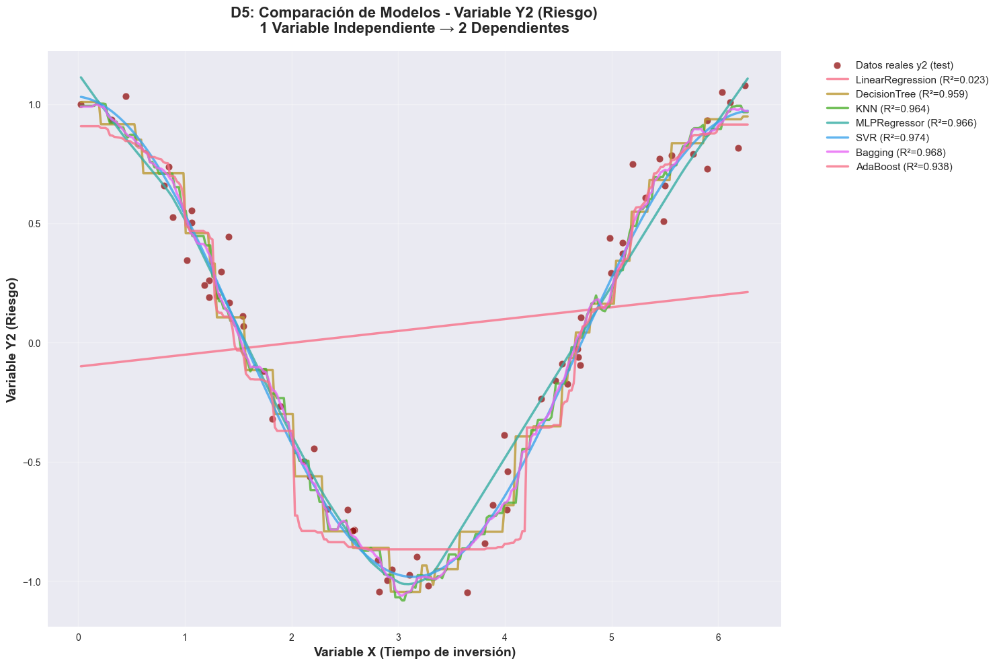

In [192]:
plt.figure(figsize=(15, 10))

# Puntos reales de test para y2
plt.scatter(X_test, y_test['y2'], color='darkred', alpha=0.7, 
           label='Datos reales y2 (test)', s=60, edgecolors='white', linewidth=0.5)

# Curvas de predicción de cada modelo para y2
for name, model in models_d5.items():
    # Predecir sobre el rango completo para curva suave
    y_pred_range = model.predict(x_range)
    y2_pred_range = y_pred_range[:, 1]  # Segunda variable: y2
    
    plt.plot(x_range, y2_pred_range, 
             linewidth=2.5, 
             label=f'{name} (R²={results_d5_y2[name]["R2"]:.3f})',
             alpha=0.8)

plt.xlabel('Variable X (Tiempo de inversión)', fontsize=14, fontweight='bold')
plt.ylabel('Variable Y2 (Riesgo)', fontsize=14, fontweight='bold')
plt.title('D5: Comparación de Modelos - Variable Y2 (Riesgo)\n1 Variable Independiente → 2 Dependientes', 
          fontsize=16, fontweight='bold', pad=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validatio

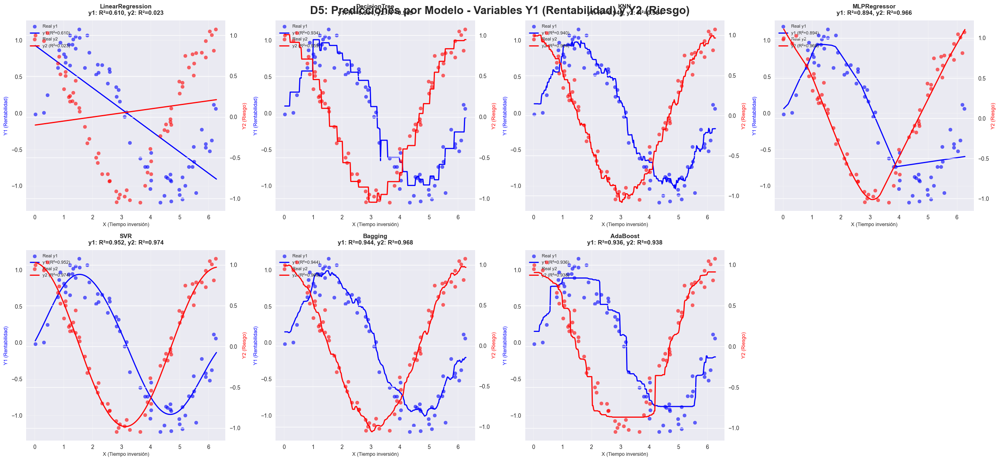

In [193]:
fig, axes = plt.subplots(2, 4, figsize=(25, 12))
axes = axes.ravel()

model_names = list(models_d5.keys())

for idx, model_name in enumerate(model_names):
    if idx >= len(axes):
        break
        
    model = models_d5[model_name]
    
    # Predecir sobre el rango completo
    y_pred_range = model.predict(x_range)
    y1_pred_range = y_pred_range[:, 0]
    y2_pred_range = y_pred_range[:, 1]
    
    # Gráfica para y1
    axes[idx].scatter(X_test, y_test['y1'], color='blue', alpha=0.6, 
                     label='Real y1', s=40)
    axes[idx].plot(x_range, y1_pred_range, 'blue', linewidth=2, 
                  label=f'y1 (R²={results_d5_y1[model_name]["R2"]:.3f})')
    
    # Gráfica para y2 (eje Y secundario)
    ax2 = axes[idx].twinx()
    ax2.scatter(X_test, y_test['y2'], color='red', alpha=0.6, 
               label='Real y2', s=40)
    ax2.plot(x_range, y2_pred_range, 'red', linewidth=2, 
            label=f'y2 (R²={results_d5_y2[model_name]["R2"]:.3f})')
    
    # Configuración del subplot
    axes[idx].set_xlabel('X (Tiempo inversión)', fontsize=9)
    axes[idx].set_ylabel('Y1 (Rentabilidad)', color='blue', fontsize=9)
    ax2.set_ylabel('Y2 (Riesgo)', color='red', fontsize=9)
    
    axes[idx].set_title(f'{model_name}\n'
                       f'y1: R²={results_d5_y1[model_name]["R2"]:.3f}, '
                       f'y2: R²={results_d5_y2[model_name]["R2"]:.3f}', 
                       fontsize=11, fontweight='bold', pad=10)
    
    # Leyendas combinadas
    lines1, labels1 = axes[idx].get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    axes[idx].legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=8)
    
    axes[idx].grid(True, alpha=0.3)

# Ocultar ejes sobrantes
for idx in range(len(models_d5), len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('D5: Predicciones por Modelo - Variables Y1 (Rentabilidad) y Y2 (Riesgo)', 
             fontsize=20, fontweight='bold', y=0.95)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


C:\Users\Yaveh\AppData\Local\Temp\ipykernel_29724\3127773589.py:60: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 1].set_xticklabels(models_common, rotation=45, ha='right')


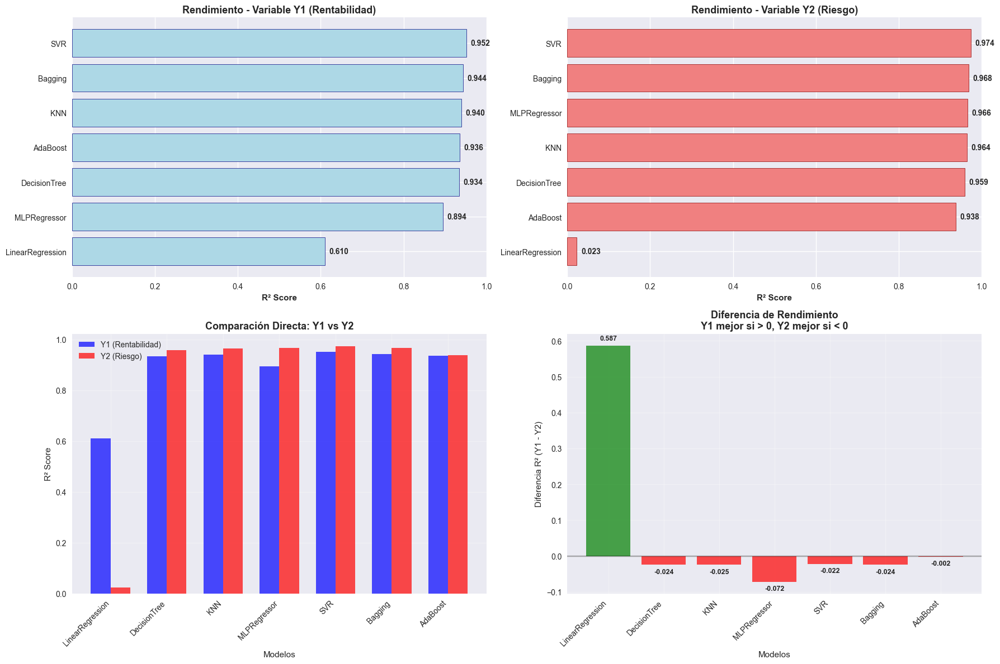

In [194]:
results_df_y1 = pd.DataFrame(results_d5_y1).T
results_df_y2 = pd.DataFrame(results_d5_y2).T

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Gráfica de barras para Y1
results_df_y1_sorted = results_df_y1.sort_values('R2', ascending=True)
bars1 = axes[0, 0].barh(results_df_y1_sorted.index, results_df_y1_sorted['R2'], 
                       color='lightblue', edgecolor='navy', linewidth=0.5)
axes[0, 0].set_xlabel('R² Score', fontweight='bold')
axes[0, 0].set_title('Rendimiento - Variable Y1 (Rentabilidad)', 
                    fontsize=13, fontweight='bold')
axes[0, 0].set_xlim(0, 1)
for i, (bar, value) in enumerate(zip(bars1, results_df_y1_sorted['R2'])):
    axes[0, 0].text(value + 0.01, bar.get_y() + bar.get_height()/2, 
                   f'{value:.3f}', va='center', fontweight='bold')

# Gráfica de barras para Y2
results_df_y2_sorted = results_df_y2.sort_values('R2', ascending=True)
bars2 = axes[0, 1].barh(results_df_y2_sorted.index, results_df_y2_sorted['R2'], 
                       color='lightcoral', edgecolor='darkred', linewidth=0.5)
axes[0, 1].set_xlabel('R² Score', fontweight='bold')
axes[0, 1].set_title('Rendimiento - Variable Y2 (Riesgo)', 
                    fontsize=13, fontweight='bold')
axes[0, 1].set_xlim(0, 1)
for i, (bar, value) in enumerate(zip(bars2, results_df_y2_sorted['R2'])):
    axes[0, 1].text(value + 0.01, bar.get_y() + bar.get_height()/2, 
                   f'{value:.3f}', va='center', fontweight='bold')

# Comparación directa R² Y1 vs Y2
models_common = results_df_y1.index
y1_r2 = [results_d5_y1[model]['R2'] for model in models_common]
y2_r2 = [results_d5_y2[model]['R2'] for model in models_common]

x_pos = np.arange(len(models_common))
width = 0.35

axes[1, 0].bar(x_pos - width/2, y1_r2, width, label='Y1 (Rentabilidad)', 
               color='blue', alpha=0.7)
axes[1, 0].bar(x_pos + width/2, y2_r2, width, label='Y2 (Riesgo)', 
               color='red', alpha=0.7)
axes[1, 0].set_xlabel('Modelos')
axes[1, 0].set_ylabel('R² Score')
axes[1, 0].set_title('Comparación Directa: Y1 vs Y2', fontsize=13, fontweight='bold')
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(models_common, rotation=45, ha='right')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Diferencia de rendimiento entre Y1 y Y2
difference = np.array(y1_r2) - np.array(y2_r2)
colors = ['green' if diff > 0 else 'red' for diff in difference]

axes[1, 1].bar(models_common, difference, color=colors, alpha=0.7)
axes[1, 1].axhline(y=0, color='black', linestyle='-', alpha=0.3)
axes[1, 1].set_xlabel('Modelos')
axes[1, 1].set_ylabel('Diferencia R² (Y1 - Y2)')
axes[1, 1].set_title('Diferencia de Rendimiento\nY1 mejor si > 0, Y2 mejor si < 0', 
                    fontsize=13, fontweight='bold')
axes[1, 1].set_xticklabels(models_common, rotation=45, ha='right')
axes[1, 1].grid(True, alpha=0.3)

# Añadir valores en las barras
for i, (model, diff) in enumerate(zip(models_common, difference)):
    axes[1, 1].text(i, diff + (0.01 if diff > 0 else -0.01), 
                   f'{diff:.3f}', ha='center', va='bottom' if diff > 0 else 'top', 
                   fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()



ANÁLISIS DE MEJORES MODELOS - DATASET D5
Mejor modelo para Y1 (Rentabilidad): SVR (R² = 0.9516)
Mejor modelo para Y2 (Riesgo): SVR (R² = 0.9737)
Mejor modelo general (promedio): SVR (R² promedio = 0.9627)


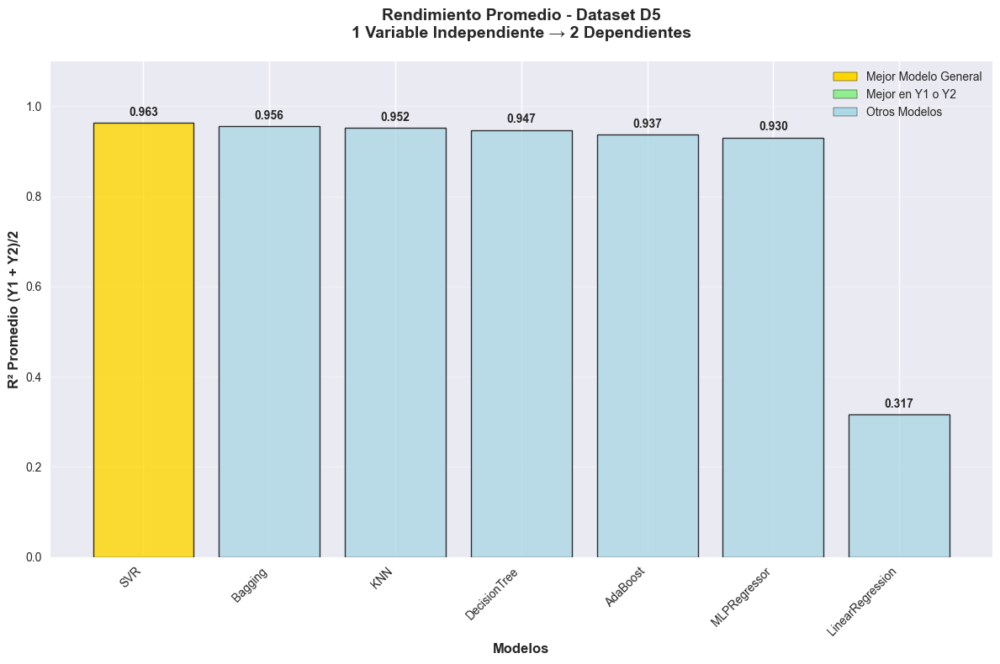

In [195]:
best_model_y1 = results_df_y1['R2'].idxmax()
best_model_y2 = results_df_y2['R2'].idxmax()

# Calcular R² promedio por modelo
average_r2 = {}
for model in models_d5.keys():
    avg_r2 = (results_d5_y1[model]['R2'] + results_d5_y2[model]['R2']) / 2
    average_r2[model] = avg_r2

best_model_overall = max(average_r2, key=average_r2.get)

print(f"\n{'='*60}")
print("ANÁLISIS DE MEJORES MODELOS - DATASET D5")
print(f"{'='*60}")
print(f"Mejor modelo para Y1 (Rentabilidad): {best_model_y1} (R² = {results_d5_y1[best_model_y1]['R2']:.4f})")
print(f"Mejor modelo para Y2 (Riesgo): {best_model_y2} (R² = {results_d5_y2[best_model_y2]['R2']:.4f})")
print(f"Mejor modelo general (promedio): {best_model_overall} (R² promedio = {average_r2[best_model_overall]:.4f})")

# Gráfica de rendimiento promedio
plt.figure(figsize=(12, 8))
sorted_models_avg = sorted(average_r2.items(), key=lambda x: x[1], reverse=True)
models_sorted, r2_avg_sorted = zip(*sorted_models_avg)

# Crear colores diferenciados para mejor visualización
colors = []
for model in models_sorted:
    if model == best_model_overall:
        colors.append('gold')
    elif model == best_model_y1 or model == best_model_y2:
        colors.append('lightgreen')
    else:
        colors.append('lightblue')

bars = plt.bar(models_sorted, r2_avg_sorted, 
               color=colors,
               alpha=0.8, edgecolor='black', linewidth=1)

plt.xlabel('Modelos', fontweight='bold', fontsize=12)
plt.ylabel('R² Promedio (Y1 + Y2)/2', fontweight='bold', fontsize=12)
plt.title('Rendimiento Promedio - Dataset D5\n1 Variable Independiente → 2 Dependientes', 
          fontsize=14, fontweight='bold', pad=20)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.ylim(0, 1.1)
plt.grid(True, alpha=0.3, axis='y')

# Añadir valores en las barras
for bar, value in zip(bars, r2_avg_sorted):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
            f'{value:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=10)

# Añadir leyenda de colores
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='gold', edgecolor='black', label='Mejor Modelo General'),
    Patch(facecolor='lightgreen', edgecolor='black', label='Mejor en Y1 o Y2'),
    Patch(facecolor='lightblue', edgecolor='black', label='Otros Modelos')
]
plt.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()


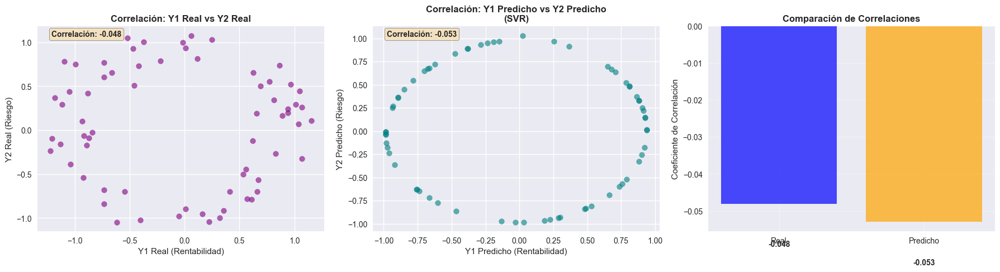

In [196]:
best_model = models_d5[best_model_overall]
y_pred_analysis = best_model.predict(X_test)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Correlación entre Y1 real y Y2 real
axes[0].scatter(y_test['y1'], y_test['y2'], alpha=0.6, color='purple')
axes[0].set_xlabel('Y1 Real (Rentabilidad)')
axes[0].set_ylabel('Y2 Real (Riesgo)')
axes[0].set_title('Correlación: Y1 Real vs Y2 Real', fontweight='bold')
corr_real = np.corrcoef(y_test['y1'], y_test['y2'])[0,1]
axes[0].text(0.05, 0.95, f'Correlación: {corr_real:.3f}', 
            transform=axes[0].transAxes, fontweight='bold',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# Correlación entre Y1 predicho y Y2 predicho
axes[1].scatter(y_pred_analysis[:, 0], y_pred_analysis[:, 1], alpha=0.6, color='teal')
axes[1].set_xlabel('Y1 Predicho (Rentabilidad)')
axes[1].set_ylabel('Y2 Predicho (Riesgo)')
axes[1].set_title(f'Correlación: Y1 Predicho vs Y2 Predicho\n({best_model_overall})', fontweight='bold')
corr_pred = np.corrcoef(y_pred_analysis[:, 0], y_pred_analysis[:, 1])[0,1]
axes[1].text(0.05, 0.95, f'Correlación: {corr_pred:.3f}', 
            transform=axes[1].transAxes, fontweight='bold',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# Comparación de correlaciones
axes[2].bar(['Real', 'Predicho'], [corr_real, corr_pred], 
           color=['blue', 'orange'], alpha=0.7)
axes[2].set_ylabel('Coeficiente de Correlación')
axes[2].set_title('Comparación de Correlaciones', fontweight='bold')
axes[2].grid(True, alpha=0.3)

# Añadir valores en las barras
for i, v in enumerate([corr_real, corr_pred]):
    axes[2].text(i, v + 0.01 * (1 if v > 0 else -1), f'{v:.3f}', 
                ha='center', va='bottom' if v > 0 else 'top', fontweight='bold')

plt.tight_layout()
plt.show()


In [197]:
print("\n" + "="*80)
print("RESULTADOS FINALES - DATASET D5")
print("="*80)

print("\n--- VARIABLE Y1 (Rentabilidad) ---")
results_df_y1_sorted = results_df_y1.sort_values('R2', ascending=False)
print(results_df_y1_sorted)

print("\n--- VARIABLE Y2 (Riesgo) ---")
results_df_y2_sorted = results_df_y2.sort_values('R2', ascending=False)
print(results_df_y2_sorted)

print(f"\nRESUMEN EJECUTIVO:")
print(f"Mejor modelo Y1: {results_df_y1_sorted.index[0]} (R² = {results_df_y1_sorted.iloc[0]['R2']:.4f})")
print(f"Mejor modelo Y2: {results_df_y2_sorted.index[0]} (R² = {results_df_y2_sorted.iloc[0]['R2']:.4f})")
print(f"Diferencia promedio R²: {np.mean(results_df_y1_sorted['R2'] - results_df_y2_sorted['R2']):.4f}")


RESULTADOS FINALES - DATASET D5

--- VARIABLE Y1 (Rentabilidad) ---
                     MAE     MSE      R2
SVR               0.1386  0.0284  0.9516
Bagging           0.1480  0.0332  0.9435
KNN               0.1511  0.0354  0.9396
AdaBoost          0.1680  0.0377  0.9358
DecisionTree      0.1570  0.0384  0.9345
MLPRegressor      0.1905  0.0620  0.8943
LinearRegression  0.4134  0.2289  0.6099

--- VARIABLE Y2 (Riesgo) ---
                     MAE     MSE      R2
SVR               0.0832  0.0110  0.9737
Bagging           0.0923  0.0136  0.9677
MLPRegressor      0.0914  0.0143  0.9659
KNN               0.0978  0.0150  0.9643
DecisionTree      0.1057  0.0172  0.9590
AdaBoost          0.1344  0.0262  0.9375
LinearRegression  0.5614  0.4103  0.0233

RESUMEN EJECUTIVO:
Mejor modelo Y1: SVR (R² = 0.9516)
Mejor modelo Y2: SVR (R² = 0.9737)
Diferencia promedio R²: 0.0597


In [198]:
df_d6 = pd.read_csv(r'C:\Users\Yaveh\Downloads\Regresion_Base-Ensambles 1\D6_2x2y_no_lineal.csv')

# Separar características y variable objetivo
X = df_d6[['x1', 'x2']]           # 2 variables independientes
y = df_d6[['y1', 'y2']]           # 2 variables dependientes

# División entrenamiento/prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42  
)

print("=== DATASET D6 - INFORMACIÓN ===")
print(f"Dimensiones: {df_d6.shape}")
print(f"Variables X: {X.columns.tolist()}")
print(f"Variables Y: {y.columns.tolist()}")
print(f"Entrenamiento: {X_train.shape[0]} muestras")
print(f"Prueba: {X_test.shape[0]} muestras")
print(f"\nEstadísticas descriptivas:")
print(df_d6.describe())


=== DATASET D6 - INFORMACIÓN ===
Dimensiones: (220, 4)
Variables X: ['x1', 'x2']
Variables Y: ['y1', 'y2']
Entrenamiento: 154 muestras
Prueba: 66 muestras

Estadísticas descriptivas:
               x1          x2          y1          y2
count  220.000000  220.000000  220.000000  220.000000
mean    -0.068263    0.088021    1.425207    0.503351
std      1.166869    1.122632    1.442865    0.763330
min     -1.980571   -1.984423   -1.428636   -1.286505
25%     -1.079620   -0.849120    0.277143   -0.034648
50%     -0.047973    0.139846    1.271698    0.528507
75%      0.914941    1.075489    2.500287    1.062428
max      1.990670    1.982221    5.015938    2.232430


In [199]:
from sklearn.multioutput import MultiOutputRegressor

# Modelos que soportan multi-output nativamente
models_multi = {
    'LinearRegression': LinearRegression(),
    'DecisionTree': DecisionTreeRegressor(max_depth=5, random_state=42),
    'KNN': KNeighborsRegressor(n_neighbors=5),
}

# Modelos que necesitan wrapper MultiOutputRegressor
models_wrapped = {
    'MLPRegressor': MultiOutputRegressor(
        MLPRegressor(hidden_layer_sizes=(64, 64), activation='relu', 
                    max_iter=2000, early_stopping=True, random_state=42)
    ),
    'SVR': MultiOutputRegressor(SVR(kernel='rbf', C=10, gamma='scale')),
    'Bagging': MultiOutputRegressor(
        BaggingRegressor(estimator=KNeighborsRegressor(n_neighbors=5), 
                        n_estimators=100, random_state=42)
    ),
    'AdaBoost': MultiOutputRegressor(
        AdaBoostRegressor(n_estimators=200, learning_rate=0.1, random_state=42)
    ),
}

# Combinar todos los modelos
models_d6 = {**models_multi, **models_wrapped}

# Stacking simplificado sin problemas de multi-output
stacking_estimators = [
    ('lr', LinearRegression()),
    ('dt', DecisionTreeRegressor(max_depth=5, random_state=42)),
    ('knn', KNeighborsRegressor(n_neighbors=5)),
]

models_d6['Stacking'] = StackingRegressor(
    estimators=stacking_estimators,
    final_estimator=LinearRegression()  # LinearRegression soporta multi-output
)

print(f"\nModelos configurados para multi-output: {list(models_d6.keys())}")


Modelos configurados para multi-output: ['LinearRegression', 'DecisionTree', 'KNN', 'MLPRegressor', 'SVR', 'Bagging', 'AdaBoost', 'Stacking']


In [200]:
results_d6_y1 = {}
results_d6_y2 = {}

print("\n=== ENTRENAMIENTO DE MODELOS D6 ===")
for name, model in models_d6.items():
    print(f"Entrenando: {name}")
    
    try:
        # Entrenar modelo
        model.fit(X_train, y_train)
        
        # Predecir
        y_pred = model.predict(X_test)
        
        # Calcular métricas para y1
        mae_y1 = mean_absolute_error(y_test['y1'], y_pred[:, 0])
        mse_y1 = mean_squared_error(y_test['y1'], y_pred[:, 0])
        r2_y1 = r2_score(y_test['y1'], y_pred[:, 0])
        
        # Calcular métricas para y2
        mae_y2 = mean_absolute_error(y_test['y2'], y_pred[:, 1])
        mse_y2 = mean_squared_error(y_test['y2'], y_pred[:, 1])
        r2_y2 = r2_score(y_test['y2'], y_pred[:, 1])
        
        # Guardar resultados por variable
        results_d6_y1[name] = {
            'MAE': round(mae_y1, 4),
            'MSE': round(mse_y1, 4),
            'R2': round(r2_y1, 4)
        }
        
        results_d6_y2[name] = {
            'MAE': round(mae_y2, 4),
            'MSE': round(mse_y2, 4),
            'R2': round(r2_y2, 4)
        }
        
        print(f"  - {name}:")
        print(f"    y1 - R² = {r2_y1:.4f}, MAE = {mae_y1:.4f}")
        print(f"    y2 - R² = {r2_y2:.4f}, MAE = {mae_y2:.4f}")
        
    except Exception as e:
        print(f"  - ERROR en {name}: {e}")
        # Si falla, usar valores por defecto
        results_d6_y1[name] = {'MAE': 999, 'MSE': 999, 'R2': -999}
        results_d6_y2[name] = {'MAE': 999, 'MSE': 999, 'R2': -999}



=== ENTRENAMIENTO DE MODELOS D6 ===
Entrenando: LinearRegression
  - LinearRegression:
    y1 - R² = 0.3339, MAE = 0.9835
    y2 - R² = 0.5874, MAE = 0.3960
Entrenando: DecisionTree
  - DecisionTree:
    y1 - R² = 0.8583, MAE = 0.4158
    y2 - R² = 0.7119, MAE = 0.3438
Entrenando: KNN
  - KNN:
    y1 - R² = 0.9525, MAE = 0.2329
    y2 - R² = 0.8566, MAE = 0.2335
Entrenando: MLPRegressor
  - MLPRegressor:
    y1 - R² = 0.9578, MAE = 0.2182
    y2 - R² = 0.8976, MAE = 0.1966
Entrenando: SVR
  - SVR:
    y1 - R² = 0.9735, MAE = 0.1816
    y2 - R² = 0.8798, MAE = 0.2154
Entrenando: Bagging
  - Bagging:
    y1 - R² = 0.9550, MAE = 0.2140
    y2 - R² = 0.8649, MAE = 0.2229
Entrenando: AdaBoost
  - AdaBoost:
    y1 - R² = 0.9082, MAE = 0.3396
    y2 - R² = 0.7742, MAE = 0.2791
Entrenando: Stacking
  - ERROR en Stacking: y should be a 1d array, got an array of shape (154, 2) instead.


In [201]:
from mpl_toolkits.mplot3d import Axes3D

# Crear malla para superficie
x1_range = np.linspace(X['x1'].min(), X['x1'].max(), 20)
x2_range = np.linspace(X['x2'].min(), X['x2'].max(), 20)
X1_mesh, X2_mesh = np.meshgrid(x1_range, x2_range)
mesh_points = np.c_[X1_mesh.ravel(), X2_mesh.ravel()]

# Seleccionar los 4 mejores modelos para visualización (basado en R² promedio)
def get_average_r2(results_y1, results_y2, model_name):
    return (results_y1[model_name]['R2'] + results_y2[model_name]['R2']) / 2

best_models = sorted(models_d6.keys(), 
                    key=lambda x: get_average_r2(results_d6_y1, results_d6_y2, x), 
                    reverse=True)[:4]

print(f"\nMejores modelos para visualización: {best_models}")



Mejores modelos para visualización: ['MLPRegressor', 'SVR', 'Bagging', 'KNN']


c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not hav

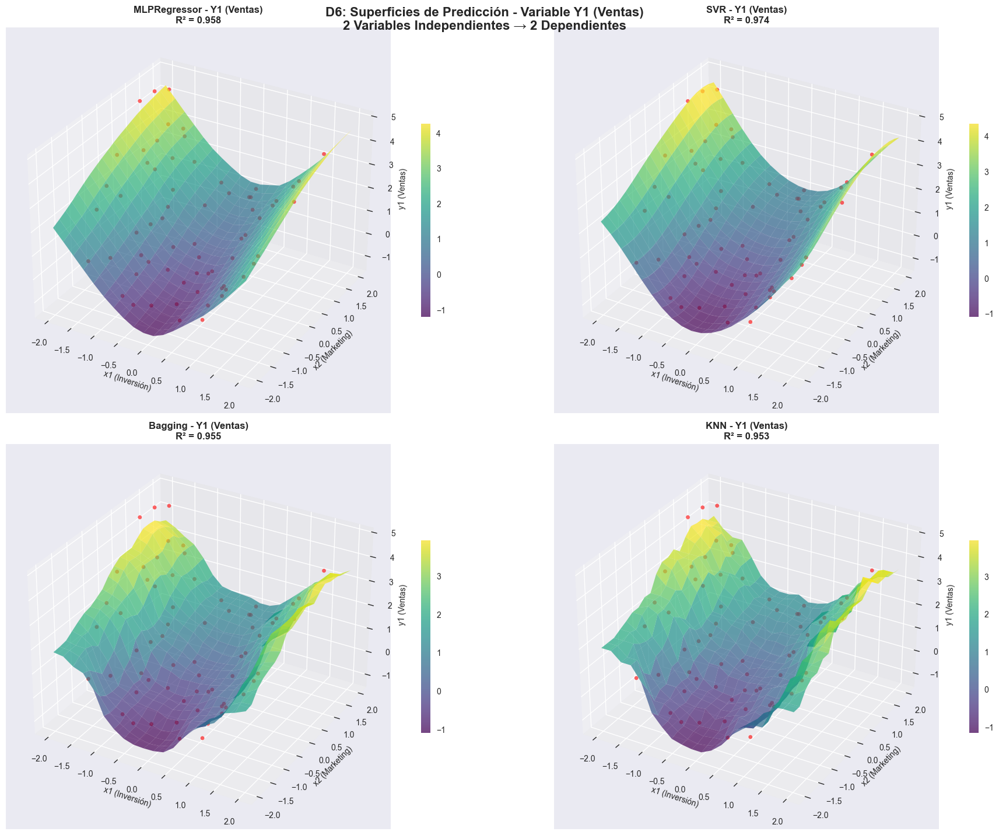

In [202]:
fig = plt.figure(figsize=(20, 15))

for idx, model_name in enumerate(best_models, 1):
    ax = fig.add_subplot(2, 2, idx, projection='3d')
    model = models_d6[model_name]
    
    # Predecir sobre la malla
    Z_pred = model.predict(mesh_points)
    Z_mesh_y1 = Z_pred[:, 0].reshape(X1_mesh.shape)  # Primera variable: y1
    
    # Superficie de predicción
    surf = ax.plot_surface(X1_mesh, X2_mesh, Z_mesh_y1, cmap='viridis', 
                          alpha=0.7, linewidth=0, antialiased=True)
    
    # Puntos reales
    ax.scatter(X_test['x1'], X_test['x2'], y_test['y1'], color='red', 
              alpha=0.6, s=20, label='Datos reales')
    
    ax.set_xlabel('x1 (Inversión)', fontsize=10)
    ax.set_ylabel('x2 (Marketing)', fontsize=10)
    ax.set_zlabel('y1 (Ventas)', fontsize=10)
    ax.set_title(f'{model_name} - Y1 (Ventas)\nR² = {results_d6_y1[model_name]["R2"]:.3f}', 
                fontsize=12, fontweight='bold')
    
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=20)

plt.suptitle('D6: Superficies de Predicción - Variable Y1 (Ventas)\n2 Variables Independientes → 2 Dependientes', 
             fontsize=16, fontweight='bold', y=0.95)
plt.tight_layout()
plt.show()

c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(
c:\Users\Yaveh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not hav

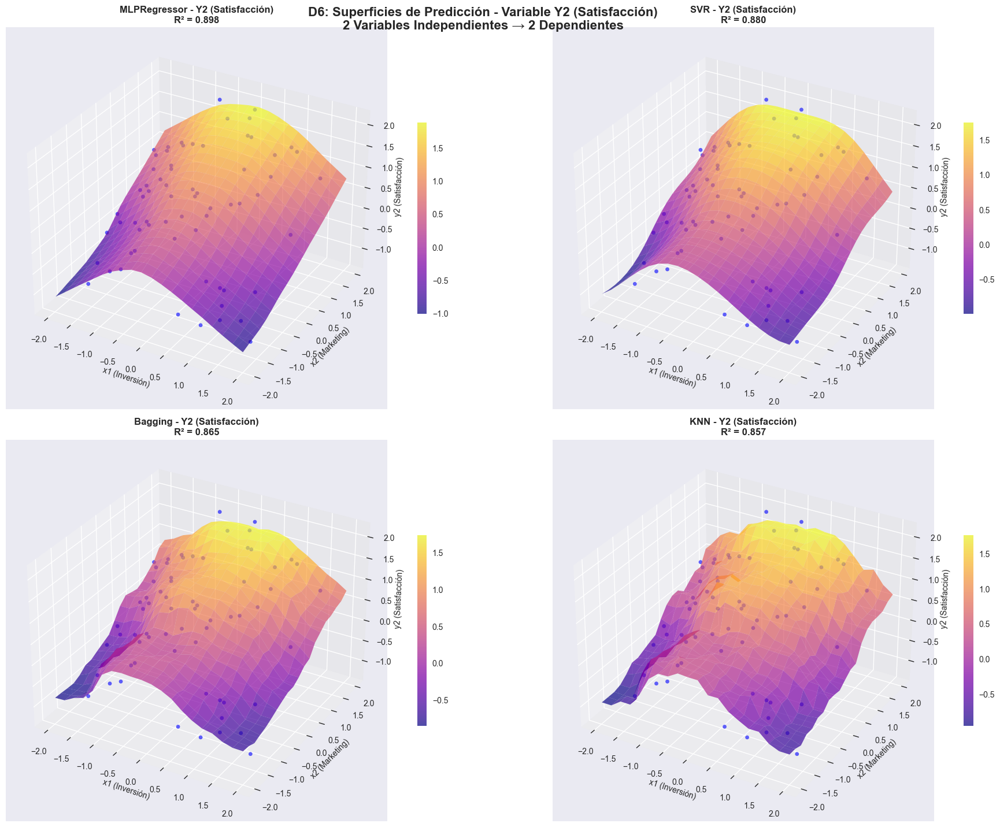

In [203]:
fig = plt.figure(figsize=(20, 15))

for idx, model_name in enumerate(best_models, 1):
    ax = fig.add_subplot(2, 2, idx, projection='3d')
    model = models_d6[model_name]
    
    # Predecir sobre la malla
    Z_pred = model.predict(mesh_points)
    Z_mesh_y2 = Z_pred[:, 1].reshape(X1_mesh.shape)  # Segunda variable: y2
    
    # Superficie de predicción
    surf = ax.plot_surface(X1_mesh, X2_mesh, Z_mesh_y2, cmap='plasma', 
                          alpha=0.7, linewidth=0, antialiased=True)
    
    # Puntos reales
    ax.scatter(X_test['x1'], X_test['x2'], y_test['y2'], color='blue', 
              alpha=0.6, s=20, label='Datos reales')
    
    ax.set_xlabel('x1 (Inversión)', fontsize=10)
    ax.set_ylabel('x2 (Marketing)', fontsize=10)
    ax.set_zlabel('y2 (Satisfacción)', fontsize=10)
    ax.set_title(f'{model_name} - Y2 (Satisfacción)\nR² = {results_d6_y2[model_name]["R2"]:.3f}', 
                fontsize=12, fontweight='bold')
    
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=20)

plt.suptitle('D6: Superficies de Predicción - Variable Y2 (Satisfacción)\n2 Variables Independientes → 2 Dependientes', 
             fontsize=16, fontweight='bold', y=0.95)
plt.tight_layout()
plt.show()

In [204]:
results_df_y1 = pd.DataFrame(results_d6_y1).T
results_df_y2 = pd.DataFrame(results_d6_y2).T

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Gráfica de barras para Y1
results_df_y1_sorted = results_df_y1.sort_values('R2', ascending=True)
bars1 = axes[0, 0].barh(results_df_y1_sorted.index, results_df_y1_sorted['R2'], 
                       color='lightblue', edgecolor='navy', linewidth=0.5)
axes[0, 0].set_xlabel('R² Score', fontweight='bold')
axes[0, 0].set_title('Rendimiento - Variable Y1 (Ventas)', 
                    fontsize=13, fontweight='bold')
axes[0, 0].set_xlim(0, 1)
for i, (bar, value) in enumerate(zip(bars1, results_df_y1_sorted['R2'])):
    axes[0, 0].text(value + 0.01, bar.get_y() + bar.get_height()/2, 
                   f'{value:.3f}', va='center', fontweight='bold')

# Gráfica de barras para Y2
results_df_y2_sorted = results_df_y2.sort_values('R2', ascending=True)
bars2 = axes[0, 1].barh(results_df_y2_sorted.index, results_df_y2_sorted['R2'], 
                       color='lightcoral', edgecolor='darkred', linewidth=0.5)
axes[0, 1].set_xlabel('R² Score', fontweight='bold')
axes[0, 1].set_title('Rendimiento - Variable Y2 (Satisfacción)', 
                    fontsize=13, fontweight='bold')
axes[0, 1].set_xlim(0, 1)
for i, (bar, value) in enumerate(zip(bars2, results_df_y2_sorted['R2'])):
    axes[0, 1].text(value + 0.01, bar.get_y() + bar.get_height()/2, 
                   f'{value:.3f}', va='center', fontweight='bold')

# Comparación directa R² Y1 vs Y2
models_common = results_df_y1.index
y1_r2 = [results_d6_y1[model]['R2'] for model in models_common]
y2_r2 = [results_d6_y2[model]['R2'] for model in models_common]

x_pos = np.arange(len(models_common))
width = 0.35

axes[1, 0].bar(x_pos - width/2, y1_r2, width, label='Y1 (Ventas)', 
               color='blue', alpha=0.7)
axes[1, 0].bar(x_pos + width/2, y2_r2, width, label='Y2 (Satisfacción)', 
               color='red', alpha=0.7)
axes[1, 0].set_xlabel('Modelos')
axes[1, 0].set_ylabel('R² Score')
axes[1, 0].set_title('Comparación Directa: Y1 vs Y2', fontsize=13, fontweight='bold')
axes[1, 0].set_xticks(x_pos)
axes[1, 0].set_xticklabels(models_common, rotation=45, ha='right')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Diferencia de rendimiento entre Y1 y Y2
difference = np.array(y1_r2) - np.array(y2_r2)
colors = ['green' if diff > 0 else 'red' for diff in difference]

axes[1, 1].bar(models_common, difference, color=colors, alpha=0.7)
axes[1, 1].axhline(y=0, color='black', linestyle='-', alpha=0.3)
axes[1, 1].set_xlabel('Modelos')
axes[1, 1].set_ylabel('Diferencia R² (Y1 - Y2)')
axes[1, 1].set_title('Diferencia de Rendimiento\nY1 mejor si > 0, Y2 mejor si < 0', 
                    fontsize=13, fontweight='bold')
axes[1, 1].set_xticklabels(models_common, rotation=45, ha='right')
axes[1, 1].grid(True, alpha=0.3)

# Añadir valores en las barras
for i, (model, diff) in enumerate(zip(models_common, difference)):
    axes[1, 1].text(i, diff + (0.01 if diff > 0 else -0.01), 
                   f'{diff:.3f}', ha='center', va='bottom' if diff > 0 else 'top', 
                   fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()

C:\Users\Yaveh\AppData\Local\Temp\ipykernel_29724\1183922927.py:60: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 1].set_xticklabels(models_common, rotation=45, ha='right')
C:\Users\Yaveh\AppData\Local\Temp\ipykernel_29724\1183922927.py:69: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


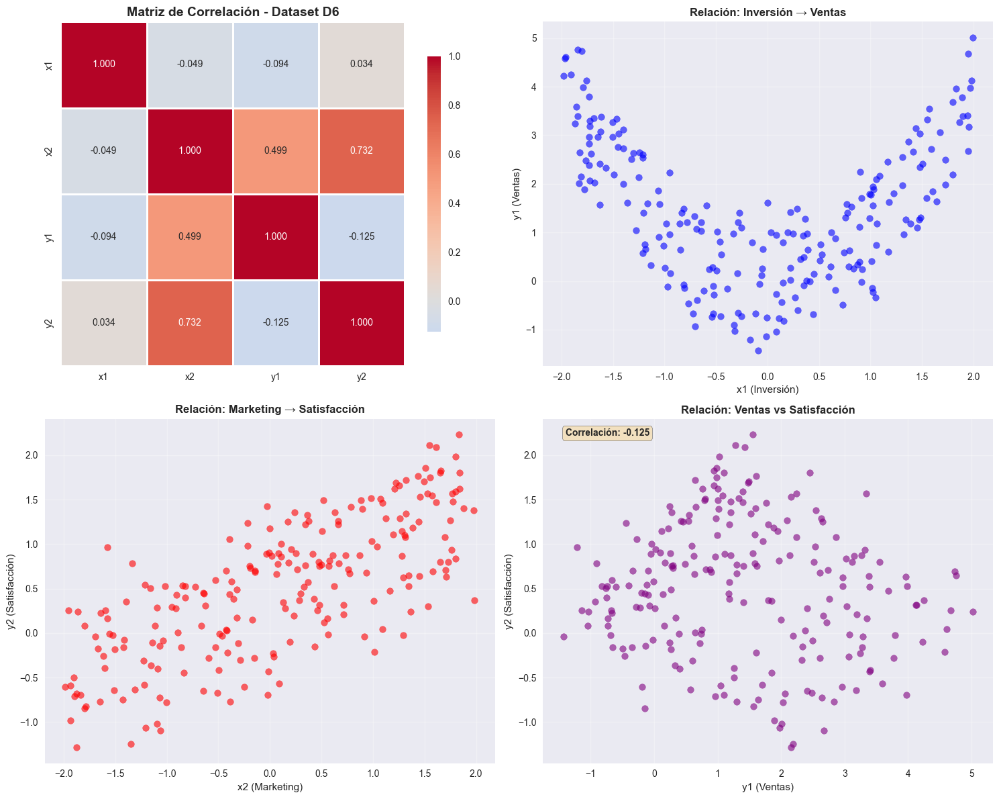

In [205]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Matriz de correlación completa
correlation_matrix = df_d6.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, 
            ax=axes[0, 0], square=True, cbar_kws={'shrink': 0.8},
            fmt='.3f', linewidths=1)
axes[0, 0].set_title('Matriz de Correlación - Dataset D6', fontsize=14, fontweight='bold')

# Scatter plot: x1 vs y1
axes[0, 1].scatter(df_d6['x1'], df_d6['y1'], alpha=0.6, color='blue')
axes[0, 1].set_xlabel('x1 (Inversión)')
axes[0, 1].set_ylabel('y1 (Ventas)')
axes[0, 1].set_title('Relación: Inversión → Ventas', fontweight='bold')
axes[0, 1].grid(True, alpha=0.3)

# Scatter plot: x2 vs y2
axes[1, 0].scatter(df_d6['x2'], df_d6['y2'], alpha=0.6, color='red')
axes[1, 0].set_xlabel('x2 (Marketing)')
axes[1, 0].set_ylabel('y2 (Satisfacción)')
axes[1, 0].set_title('Relación: Marketing → Satisfacción', fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# Scatter plot: y1 vs y2
axes[1, 1].scatter(df_d6['y1'], df_d6['y2'], alpha=0.6, color='purple')
axes[1, 1].set_xlabel('y1 (Ventas)')
axes[1, 1].set_ylabel('y2 (Satisfacción)')
axes[1, 1].set_title('Relación: Ventas vs Satisfacción', fontweight='bold')
corr_y1y2 = np.corrcoef(df_d6['y1'], df_d6['y2'])[0,1]
axes[1, 1].text(0.05, 0.95, f'Correlación: {corr_y1y2:.3f}', 
               transform=axes[1, 1].transAxes, fontweight='bold',
               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



ANÁLISIS DE MEJORES MODELOS - DATASET D6
Mejor modelo para Y1 (Ventas): SVR (R² = 0.9735)
Mejor modelo para Y2 (Satisfacción): MLPRegressor (R² = 0.8976)
Mejor modelo general (promedio): MLPRegressor (R² promedio = 0.9277)


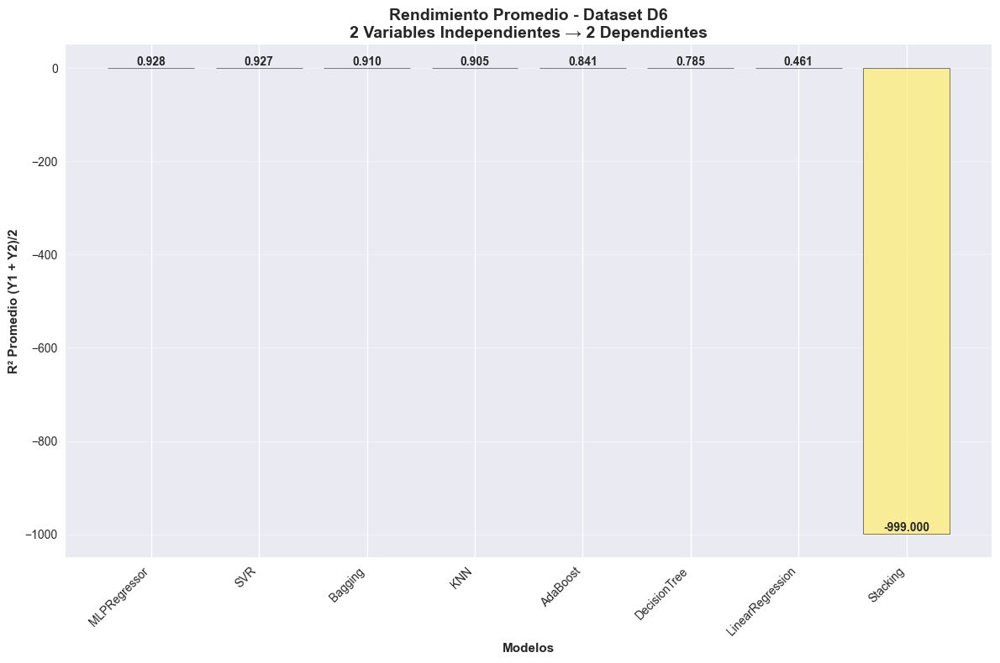

In [206]:
best_model_y1 = results_df_y1['R2'].idxmax()
best_model_y2 = results_df_y2['R2'].idxmax()

# Calcular R² promedio por modelo
average_r2 = {}
for model in models_d6.keys():
    avg_r2 = (results_d6_y1[model]['R2'] + results_d6_y2[model]['R2']) / 2
    average_r2[model] = avg_r2

best_model_overall = max(average_r2, key=average_r2.get)

print(f"\n{'='*60}")
print("ANÁLISIS DE MEJORES MODELOS - DATASET D6")
print(f"{'='*60}")
print(f"Mejor modelo para Y1 (Ventas): {best_model_y1} (R² = {results_d6_y1[best_model_y1]['R2']:.4f})")
print(f"Mejor modelo para Y2 (Satisfacción): {best_model_y2} (R² = {results_d6_y2[best_model_y2]['R2']:.4f})")
print(f"Mejor modelo general (promedio): {best_model_overall} (R² promedio = {average_r2[best_model_overall]:.4f})")

# Gráfica de rendimiento promedio
plt.figure(figsize=(12, 8))
sorted_models_avg = sorted(average_r2.items(), key=lambda x: x[1], reverse=True)
models_sorted, r2_avg_sorted = zip(*sorted_models_avg)

bars = plt.bar(models_sorted, r2_avg_sorted, 
               color=plt.cm.Set3(np.linspace(0, 1, len(models_sorted))),
               alpha=0.7, edgecolor='black', linewidth=0.5)

plt.xlabel('Modelos', fontweight='bold')
plt.ylabel('R² Promedio (Y1 + Y2)/2', fontweight='bold')
plt.title('Rendimiento Promedio - Dataset D6\n2 Variables Independientes → 2 Dependientes', 
          fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3, axis='y')

# Añadir valores en las barras
for bar, value in zip(bars, r2_avg_sorted):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
            f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

In [207]:
print("\n" + "="*80)
print("RESULTADOS FINALES - DATASET D6")
print("="*80)

print("\n--- VARIABLE Y1 (Ventas) ---")
results_df_y1_sorted = results_df_y1.sort_values('R2', ascending=False)
print(results_df_y1_sorted)

print("\n--- VARIABLE Y2 (Satisfacción) ---")
results_df_y2_sorted = results_df_y2.sort_values('R2', ascending=False)
print(results_df_y2_sorted)

print(f"\nRESUMEN EJECUTIVO:")
print(f"Mejor modelo Y1: {results_df_y1_sorted.index[0]} (R² = {results_df_y1_sorted.iloc[0]['R2']:.4f})")
print(f"Mejor modelo Y2: {results_df_y2_sorted.index[0]} (R² = {results_df_y2_sorted.iloc[0]['R2']:.4f})")
print(f"Modelo más consistente: {best_model_overall} (R² promedio = {average_r2[best_model_overall]:.4f})")



RESULTADOS FINALES - DATASET D6

--- VARIABLE Y1 (Ventas) ---
                       MAE       MSE        R2
SVR                 0.1816    0.0498    0.9735
MLPRegressor        0.2182    0.0792    0.9578
Bagging             0.2140    0.0844    0.9550
KNN                 0.2329    0.0890    0.9525
AdaBoost            0.3396    0.1721    0.9082
DecisionTree        0.4158    0.2656    0.8583
LinearRegression    0.9835    1.2491    0.3339
Stacking          999.0000  999.0000 -999.0000

--- VARIABLE Y2 (Satisfacción) ---
                       MAE       MSE        R2
MLPRegressor        0.1966    0.0576    0.8976
SVR                 0.2154    0.0676    0.8798
Bagging             0.2229    0.0760    0.8649
KNN                 0.2335    0.0807    0.8566
AdaBoost            0.2791    0.1271    0.7742
DecisionTree        0.3438    0.1621    0.7119
LinearRegression    0.3960    0.2321    0.5874
Stacking          999.0000  999.0000 -999.0000

RESUMEN EJECUTIVO:
Mejor modelo Y1: SVR (R² = 0.9735)
